# Strategie ewolucyjne

Notebook pokazuje podstawowe mechanizmy strategii ewolucyjnych.

In [1]:
import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm

%matplotlib inline

## Przykładowe problemy testowe

In [2]:
# Sphere function (minimum at 0)
def objective_function_F1(X):
    return - np.sum(X**2, axis=1)

# Sphere function - modified
def objective_function_F1a(X):
    return - (X[:, 0]**2 + 9*X[:, 1]**2)

# Sphere function - modified
def objective_function_F1b(X):
    return - (X[:, 0]**2 + 625*X[:, 1]**2)

# Sphere function - modified
def objective_function_F1c(X):
    return - (X[:, 0]**2 + 2*X[:, 1]**2 - 2 * X[:, 0] * X[:, 1])

In [3]:
# Rastrigin function (minimum at 0)
def objective_function_F6(X):
    return - 10.0 * X.shape[1] - np.sum(X**2, axis=1) + 10.0 * np.sum(np.cos(2 * np.pi * X), axis=1)

In [4]:
# Schwefel function (minimum at 420.9687)
# (REMARK: should be considered only on [-500, 500]^d, because there are better minima outside)
def objective_function_F7(X):
    return - 418.9829 * X.shape[1] + np.sum(np.clip(X, -500., 500.) * np.sin(np.sqrt(np.abs(np.clip(X, -500., 500.)))), axis=1)

In [5]:
# Griewank function (minimum at 0)
def objective_function_F8(X):
    return - 1 - np.sum(X**2 / 4000, axis=1) + np.prod(np.cos(X / np.sqrt(np.linspace(1, X.shape[1], X.shape[1]))), axis=1)

In [6]:
def plot_3D_benchmark_function(objective_function, domain_X, domain_Y, title):
    plt.figure(figsize=(12, 8))
    ax = plt.gca(projection='3d')
    X, Y = np.meshgrid(domain_X, domain_Y)
    Z = - objective_function(np.vstack([X.ravel(), Y.ravel()]).T).reshape(X.shape[0], X.shape[1])
    surf = ax.plot_surface(X, Y, Z, rstride=1, cstride=1, cmap=cm.hot, linewidth=0, antialiased=True)
    plt.title(title)
    plt.show()

In [7]:
def plot_contour_benchmark_function(objective_function, domain_X, domain_Y, title):
    plt.figure(figsize=(9, 9))
    X, Y = np.meshgrid(domain_X, domain_Y)
    Z = - objective_function(np.vstack([X.ravel(), Y.ravel()]).T).reshape(X.shape[0], X.shape[1])
    plt.contour(X, Y, Z, 50)
    plt.title(title)
    plt.show()

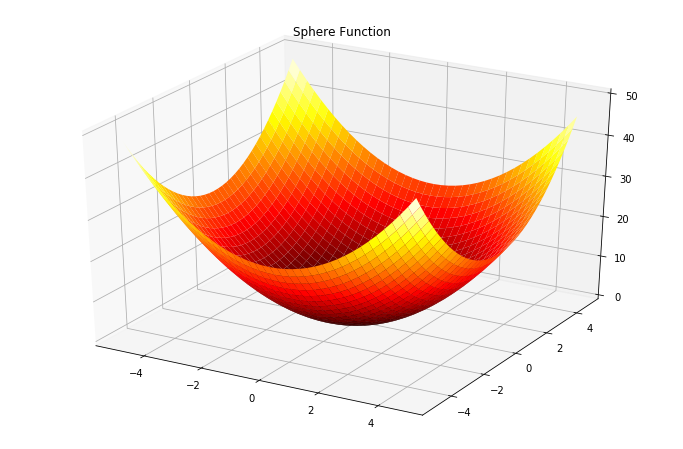

In [8]:
plot_3D_benchmark_function(objective_function_F1, np.arange(-5, 5, 0.25), np.arange(-5, 5, 0.25), 'Sphere Function')

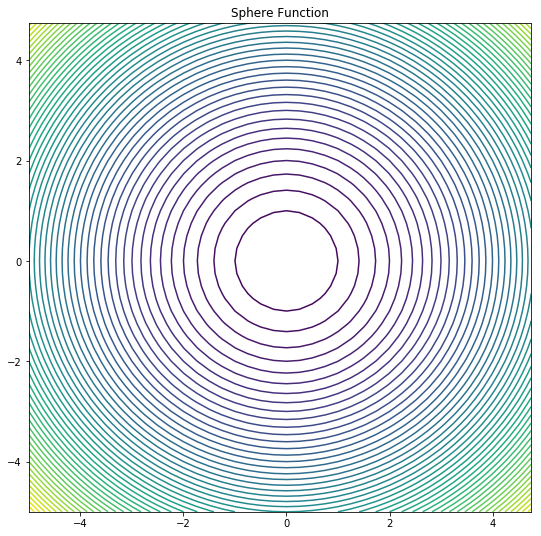

In [9]:
plot_contour_benchmark_function(objective_function_F1, np.arange(-5, 5, 0.25), np.arange(-5, 5, 0.25), 'Sphere Function')

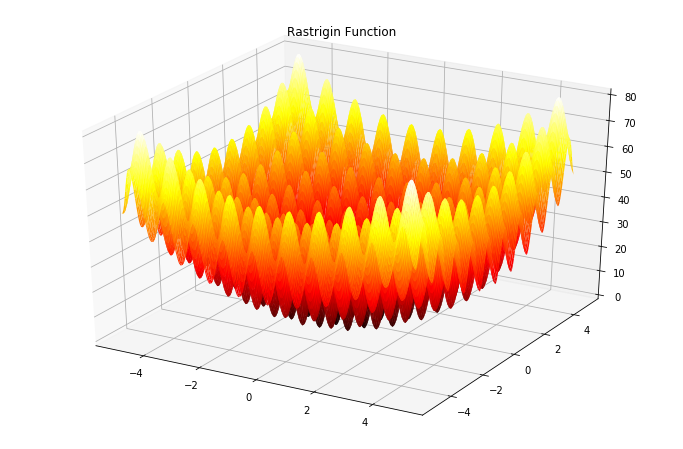

In [10]:
plot_3D_benchmark_function(objective_function_F6, np.arange(-5, 5, 0.05), np.arange(-5, 5, 0.05), 'Rastrigin Function')

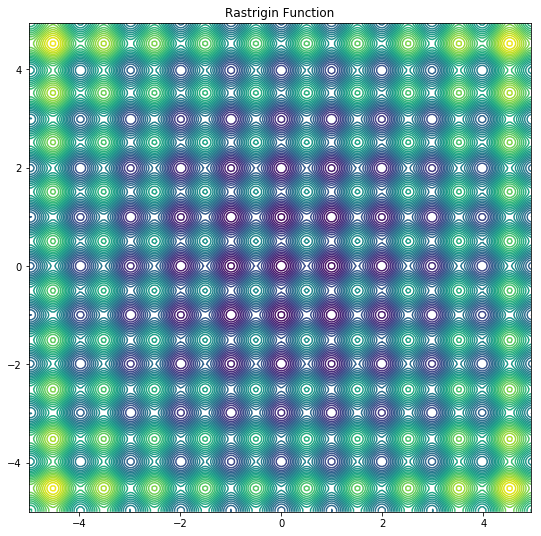

In [11]:
plot_contour_benchmark_function(objective_function_F6, np.arange(-5, 5, 0.05), np.arange(-5, 5, 0.05), 'Rastrigin Function')

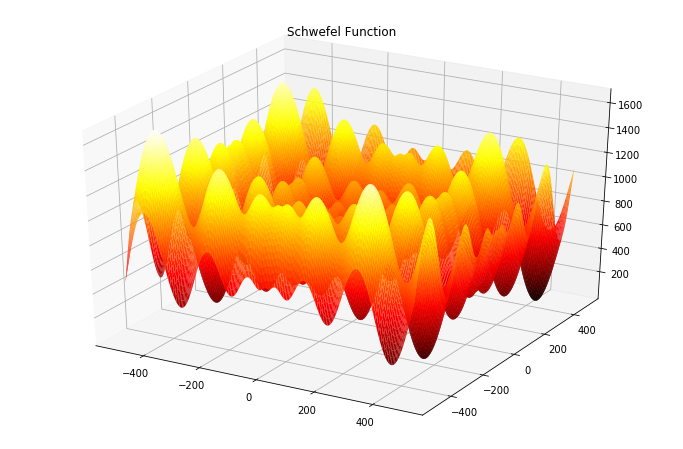

In [12]:
plot_3D_benchmark_function(objective_function_F7, np.arange(-500, 500, 5), np.arange(-500, 500, 5), 'Schwefel Function')

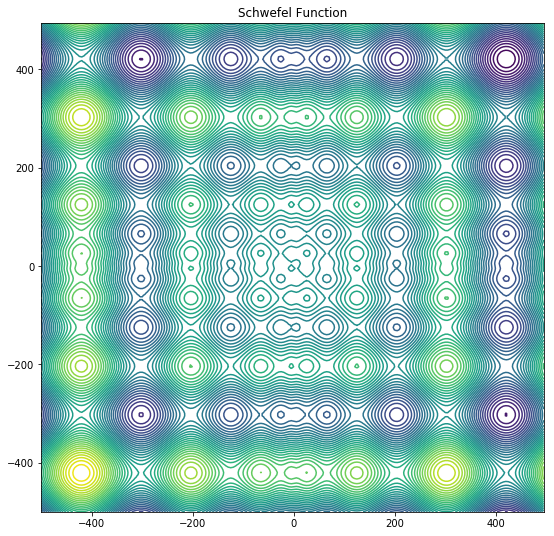

In [13]:
plot_contour_benchmark_function(objective_function_F7, np.arange(-500, 500, 5), np.arange(-500, 500, 5), 'Schwefel Function')

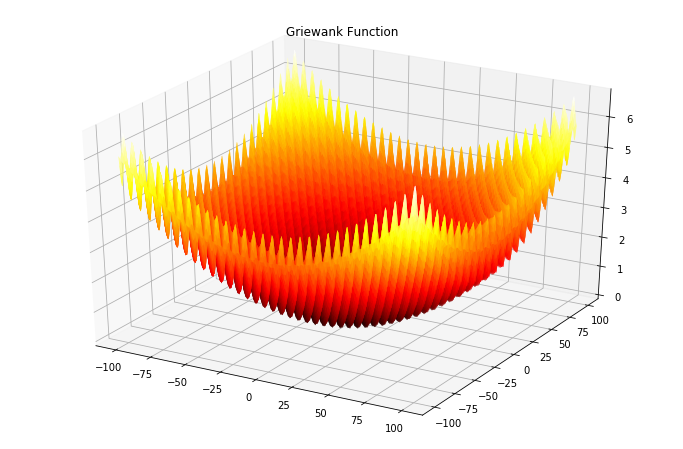

In [14]:
plot_3D_benchmark_function(objective_function_F8, np.arange(-100, 100, 0.5), np.arange(-100, 100, 0.5), 'Griewank Function')

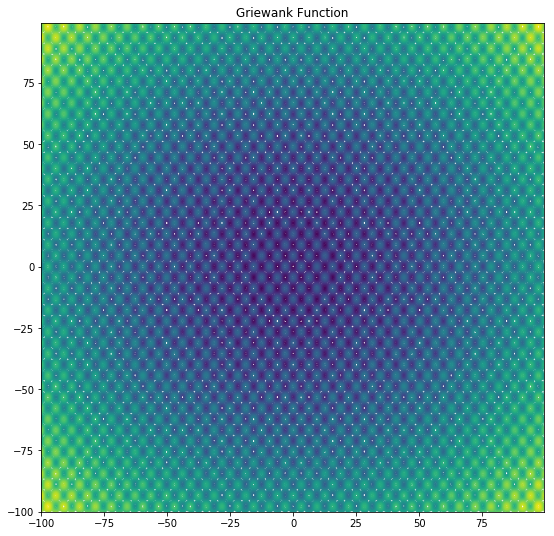

In [15]:
plot_contour_benchmark_function(objective_function_F8, np.arange(-100, 100, 0.5), np.arange(-100, 100, 0.5), 'Griewank Function')

## Przykładowe modele mutacji

In [16]:
N = 250
d = 2

objective_function = objective_function_F1a

original_individual = np.array([[1, 1]])

### Przykład 1:

$x_i = x_i + \varepsilon_i$, gdzie $\varepsilon_i$ ma rozkład normalny $\mathcal{N}(0, \sigma^2)$, zaś $\sigma$ jest taka sama dla wszystkich $i = 1, 2, \ldots, d$

In [17]:
sigma = 0.25
mutations = original_individual + sigma * np.random.randn(N, d)

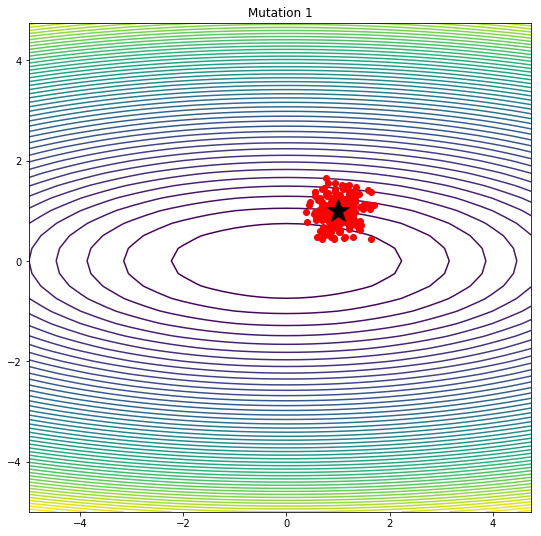

In [18]:
domain_X = np.arange(-5, 5, 0.25)
domain_Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(domain_X, domain_Y)
Z = - objective_function(np.vstack([X.ravel(), Y.ravel()]).T).reshape(X.shape[0], X.shape[1])

plt.figure(figsize=(9, 9))
plt.contour(X, Y, Z, 50)
plt.plot(mutations[:, 0], mutations[:, 1], 'ro')
plt.plot(original_individual[0, 0], original_individual[0, 1], 'k*', markersize=24)
plt.title('Mutation 1')
plt.show()

### Przykład 2:

$x_i = x_i + \varepsilon_i$, gdzie $\varepsilon_i$ ma rozkład normalny $\mathcal{N}(0, \sigma_i^2)$, zaś $\sigma_i$ może być różna dla różnych $i = 1, 2, \ldots, d$

In [19]:
sigma = np.array([0.25, 0.5])
mutations = original_individual + sigma * np.random.randn(N, d)

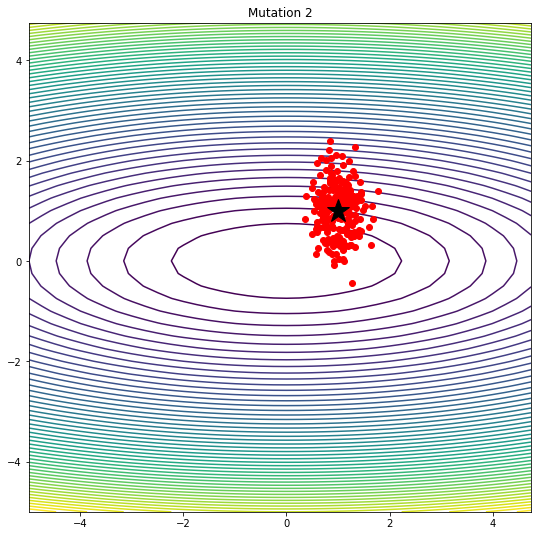

In [20]:
domain_X = np.arange(-5, 5, 0.25)
domain_Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(domain_X, domain_Y)
Z = - objective_function(np.vstack([X.ravel(), Y.ravel()]).T).reshape(X.shape[0], X.shape[1])

plt.figure(figsize=(9, 9))
plt.contour(X, Y, Z, 50)
plt.plot(mutations[:, 0], mutations[:, 1], 'ro')
plt.plot(original_individual[0, 0], original_individual[0, 1], 'k*', markersize=24)
plt.title('Mutation 2')
plt.show()

### Przykład 3:

$\mathbf{x} = \mathbf{x} + \boldsymbol{\varepsilon}$, gdzie $\boldsymbol{\varepsilon}$ ma wielowymiarowy rozkład normalny $\mathcal{N}(\mathbf{0}, \boldsymbol{\Sigma})$

In [21]:
S = np.array([[0.25, 0.25],[0.25, 0.5]])
mutations = original_individual + np.dot(np.random.randn(N, d), np.linalg.cholesky(S).T)

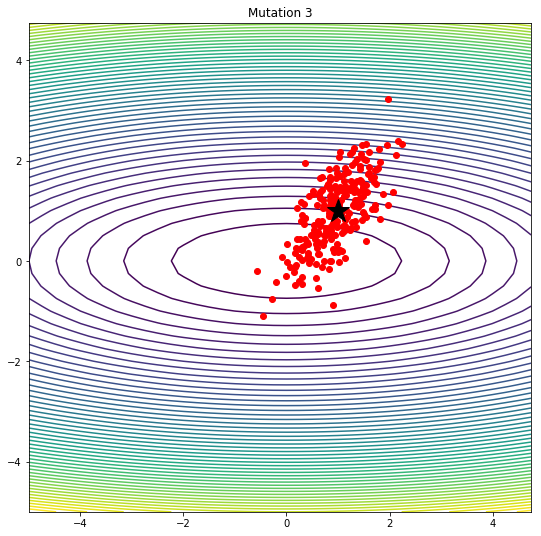

In [22]:
domain_X = np.arange(-5, 5, 0.25)
domain_Y = np.arange(-5, 5, 0.25)
X, Y = np.meshgrid(domain_X, domain_Y)
Z = - objective_function(np.vstack([X.ravel(), Y.ravel()]).T).reshape(X.shape[0], X.shape[1])

plt.figure(figsize=(9, 9))
plt.contour(X, Y, Z, 50)
plt.plot(mutations[:, 0], mutations[:, 1], 'ro')
plt.plot(original_individual[0, 0], original_individual[0, 1], 'k*', markersize=24)
plt.title('Mutation 3')
plt.show()

## Przykładowa strategia ewolucyjna

In [17]:
def es(objective_function, chromosome_length, population_size, number_of_iterations, number_of_offspring, number_of_parents, sigma, tau, tau_0, log_frequency=1):

    best_solution = np.empty((1, chromosome_length))
    best_solution_objective_value = 0.00

    log_objective_values = np.empty((number_of_iterations, 4))
    log_best_solutions = np.empty((number_of_iterations, chromosome_length))
    log_best_sigmas = np.empty((number_of_iterations, chromosome_length))

    # generating an initial population
    current_population_solutions = 100.0 * np.random.rand(population_size, chromosome_length)
    current_population_sigmas = sigma * np.ones((population_size, chromosome_length))

    # evaluating the objective function on the current population
    current_population_objective_values = objective_function(current_population_solutions)

    for t in range(number_of_iterations):

        # selecting the parent indices by the roulette wheel method
        fitness_values = current_population_objective_values - current_population_objective_values.min()
        if fitness_values.sum() > 0:
            fitness_values = fitness_values / fitness_values.sum()
        else:
            fitness_values = 1.0 / population_size * np.ones(population_size)
        parent_indices = np.random.choice(population_size, (number_of_offspring, number_of_parents), True, fitness_values).astype(np.int64)

        # creating the children population by Global Intermediere Recombination
        children_population_solutions = np.zeros((number_of_offspring, chromosome_length))
        children_population_sigmas = np.zeros((number_of_offspring, chromosome_length))
        for i in range(number_of_offspring):
            children_population_solutions[i, :] = current_population_solutions[parent_indices[i, :], :].mean(axis=0)
            children_population_sigmas[i, :] = current_population_sigmas[parent_indices[i, :], :].mean(axis=0)

        # mutating the children population by adding random gaussian noise
        children_population_sigmas = children_population_sigmas * np.exp(tau * np.random.randn(number_of_offspring, chromosome_length) + tau_0 * np.random.randn(number_of_offspring, 1))
        children_population_solutions = children_population_solutions + children_population_sigmas * np.random.randn(number_of_offspring, chromosome_length)

        # evaluating the objective function on the children population
        children_population_objective_values = objective_function(children_population_solutions)

        # replacing the current population by (Mu + Lambda) Replacement
        current_population_objective_values = np.hstack([current_population_objective_values, children_population_objective_values])
        current_population_solutions = np.vstack([current_population_solutions, children_population_solutions])
        current_population_sigmas = np.vstack([current_population_sigmas, children_population_sigmas])

        I = np.argsort(current_population_objective_values)[::-1]
        current_population_solutions = current_population_solutions[I[:population_size], :]
        current_population_sigmas = current_population_sigmas[I[:population_size], :]
        current_population_objective_values = current_population_objective_values[I[:population_size]]

        # recording some statistics
        if best_solution_objective_value < current_population_objective_values[0]:
            best_solution = current_population_solutions[0, :]
            best_solution_objective_value = current_population_objective_values[0]
        log_objective_values[t, :] = [current_population_objective_values.min(), current_population_objective_values.max(), current_population_objective_values.mean(), current_population_objective_values.std()]
        log_best_solutions[t, :] = current_population_solutions[0, :]
        log_best_sigmas[t, :] = current_population_sigmas[0, :]

        if np.mod(t, log_frequency) == 0:
            print("Iteration %04d : best score = %0.8f, mean score = %0.8f." % (t, log_objective_values[:t+1, 1].max(), log_objective_values[t, 2]))

    return best_solution_objective_value, best_solution, log_objective_values, log_best_solutions, log_best_sigmas

### Działanie strategii ewolucyjnej dla funkcji sferycznej F1

Iteration 0000 : best score = -6271.41078549, mean score = -26296.02719420.
Iteration 0010 : best score = -35.24605548, mean score = -205.17522503.
Iteration 0020 : best score = -0.11741457, mean score = -0.49970357.
Iteration 0030 : best score = -0.00014770, mean score = -0.00105027.
Iteration 0040 : best score = -0.00000033, mean score = -0.00000196.
Iteration 0050 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0060 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0070 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0080 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0090 : best score = -0.00000000, mean score = -0.00000000.


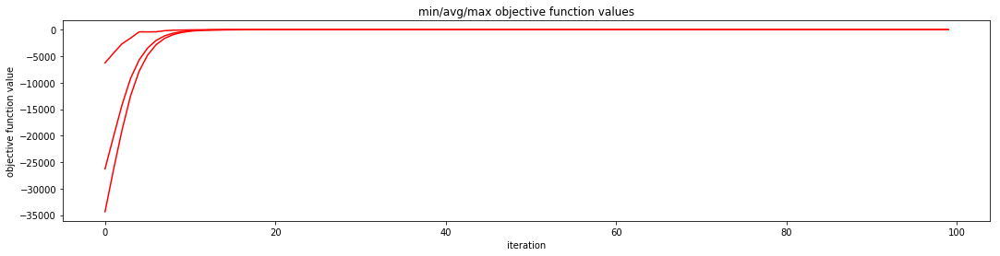

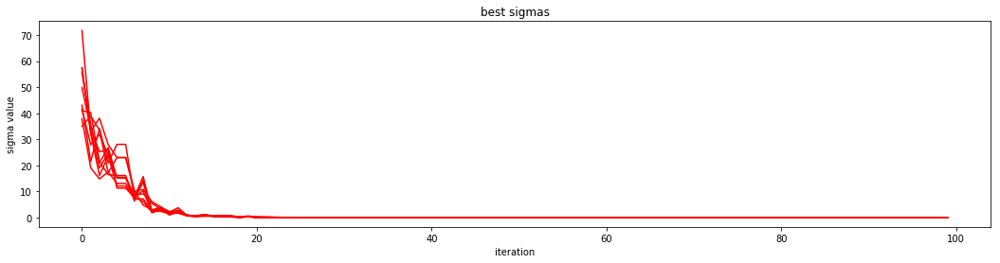

In [24]:
d = 10
N = 2000
T = 100

best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    objective_function_F1, d, N, T, 2*N, 2, 50.0, 1/np.sqrt(2*d), 1/np.sqrt(2*np.sqrt(d)), 10)

plt.figure(figsize=(18, 4))
plt.plot(history_objective_values[:, 0], 'r-')
plt.plot(history_objective_values[:, 1], 'r-')
plt.plot(history_objective_values[:, 2], 'r-')
plt.xlabel('iteration')
plt.ylabel('objective function value')
plt.title('min/avg/max objective function values')
plt.show()

plt.figure(figsize=(18, 4))
plt.plot(history_best_sigmas, 'r-')
plt.xlabel('iteration')
plt.ylabel('sigma value')
plt.title('best sigmas')
plt.show()

### Działanie strategii ewolucyjnej dla funkcji Rastrigina F6

Iteration 0000 : best score = -6070.64129014, mean score = -26625.78603748.
Iteration 0010 : best score = -113.79844421, mean score = -304.33260433.
Iteration 0020 : best score = -34.39828158, mean score = -75.70627005.
Iteration 0030 : best score = -20.14501431, mean score = -61.78655932.
Iteration 0040 : best score = -20.14501431, mean score = -55.51577579.
Iteration 0050 : best score = -20.14501431, mean score = -51.08804997.
Iteration 0060 : best score = -1.12155817, mean score = -5.91850777.
Iteration 0070 : best score = -0.00161843, mean score = -0.01284879.
Iteration 0080 : best score = -0.00000590, mean score = -0.00002873.
Iteration 0090 : best score = -0.00000001, mean score = -0.00000006.


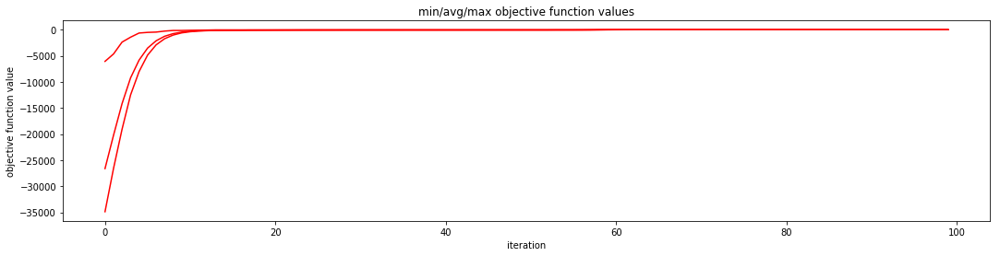

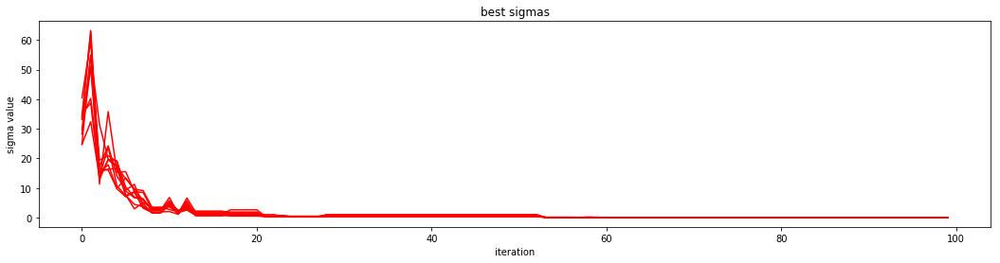

In [25]:
d = 10
N = 2000
T = 100

best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    objective_function_F6, d, N, T, 2*N, 2, 50.0, 1/np.sqrt(2*d), 1/np.sqrt(2*np.sqrt(d)), 10)

plt.figure(figsize=(18, 4))
plt.plot(history_objective_values[:, 0], 'r-')
plt.plot(history_objective_values[:, 1], 'r-')
plt.plot(history_objective_values[:, 2], 'r-')
plt.xlabel('iteration')
plt.ylabel('objective function value')
plt.title('min/avg/max objective function values')
plt.show()

plt.figure(figsize=(18, 4))
plt.plot(history_best_sigmas, 'r-')
plt.xlabel('iteration')
plt.ylabel('sigma value')
plt.title('best sigmas')
plt.show()

### Działanie strategii ewolucyjnej dla funkcji Griewanka F8

Iteration 0000 : best score = -2.70359867, mean score = -7.58155312.
Iteration 0010 : best score = -0.74310533, mean score = -1.05830077.
Iteration 0020 : best score = -0.06089747, mean score = -0.29505270.
Iteration 0030 : best score = -0.00021182, mean score = -0.00104548.
Iteration 0040 : best score = -0.00000060, mean score = -0.00000397.
Iteration 0050 : best score = -0.00000000, mean score = -0.00000001.
Iteration 0060 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0070 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0080 : best score = 0.00000000, mean score = -0.00000000.
Iteration 0090 : best score = 0.00000000, mean score = 0.00000000.


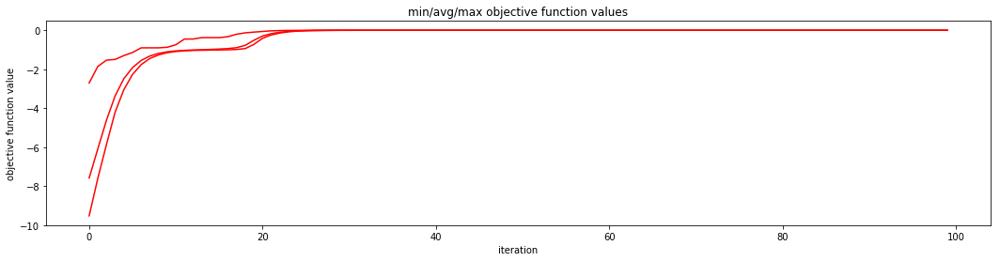

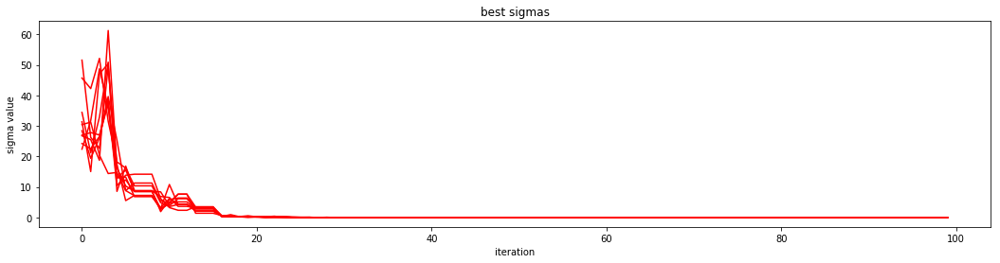

In [26]:
d = 10
N = 2000
T = 100

best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
    objective_function_F8, d, N, T, 2*N, 2, 50.0, 1/np.sqrt(2*d), 1/np.sqrt(2*np.sqrt(d)), 10)

plt.figure(figsize=(18, 4))
plt.plot(history_objective_values[:, 0], 'r-')
plt.plot(history_objective_values[:, 1], 'r-')
plt.plot(history_objective_values[:, 2], 'r-')
plt.xlabel('iteration')
plt.ylabel('objective function value')
plt.title('min/avg/max objective function values')
plt.show()

plt.figure(figsize=(18, 4))
plt.plot(history_best_sigmas, 'r-')
plt.xlabel('iteration')
plt.ylabel('sigma value')
plt.title('best sigmas')
plt.show()

### Problem 1

In [24]:
def run_experiment(d, function, N=2000, T=100, number_of_parents=2):
    best_objective_value, best_chromosome, history_objective_values, history_best_chromosome, history_best_sigmas = es(
        function, d, N, T, 2*N, number_of_parents, 50.0, 1/np.sqrt(2*d), 1/np.sqrt(2*np.sqrt(d)), 10)

    plt.figure(figsize=(18, 4))
    plt.plot(history_objective_values[:, 0], 'r-')
    plt.plot(history_objective_values[:, 1], 'r-')
    plt.plot(history_objective_values[:, 2], 'r-')
    plt.xlabel('iteration')
    plt.ylabel('objective function value')
    plt.title('min/avg/max objective function values')
    plt.show()

    plt.figure(figsize=(18, 4))
    plt.plot(history_best_sigmas, 'r-')
    plt.xlabel('iteration')
    plt.ylabel('sigma value')
    plt.title('best sigmas')
    plt.show()

#### Sphere function



d = 10
Iteration 0000 : best score = -5020.64752116, mean score = -26576.49742622.
Iteration 0010 : best score = -34.05079316, mean score = -228.25849535.
Iteration 0020 : best score = -0.10983488, mean score = -0.67519307.
Iteration 0030 : best score = -0.00014845, mean score = -0.00157773.
Iteration 0040 : best score = -0.00000050, mean score = -0.00000295.
Iteration 0050 : best score = -0.00000000, mean score = -0.00000001.
Iteration 0060 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0070 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0080 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0090 : best score = -0.00000000, mean score = -0.00000000.


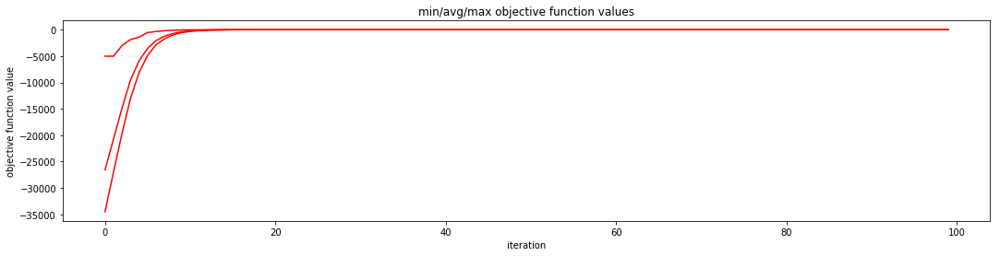

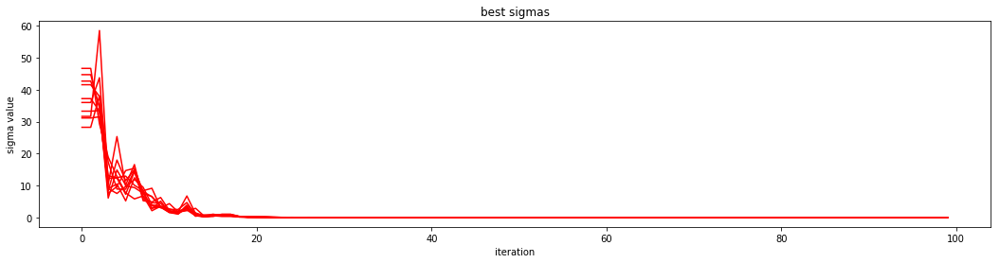



d = 20
Iteration 0000 : best score = -25059.72276620, mean score = -59324.50674867.
Iteration 0010 : best score = -757.41528433, mean score = -2179.30594591.
Iteration 0020 : best score = -20.09217718, mean score = -49.55238164.
Iteration 0030 : best score = -0.50213788, mean score = -1.22190739.
Iteration 0040 : best score = -0.00865382, mean score = -0.02779876.
Iteration 0050 : best score = -0.00024200, mean score = -0.00063463.
Iteration 0060 : best score = -0.00000633, mean score = -0.00001454.
Iteration 0070 : best score = -0.00000012, mean score = -0.00000039.
Iteration 0080 : best score = -0.00000000, mean score = -0.00000001.
Iteration 0090 : best score = -0.00000000, mean score = -0.00000000.


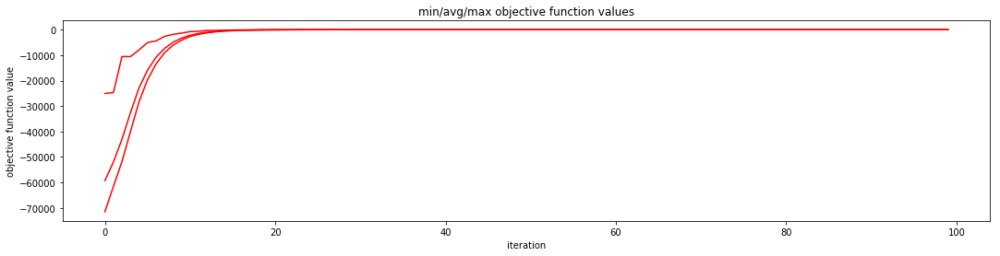

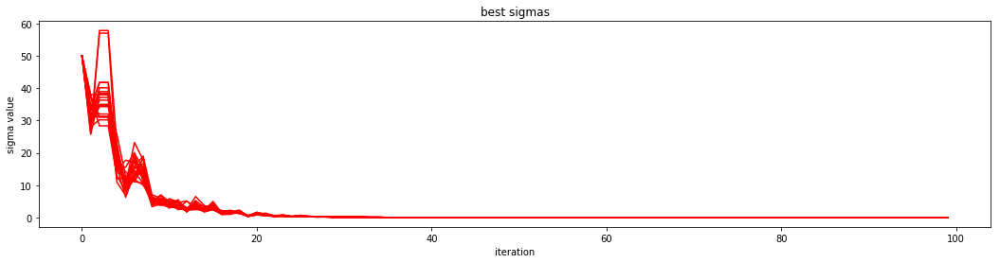



d = 50
Iteration 0000 : best score = -98840.58789693, mean score = -160332.41415681.
Iteration 0010 : best score = -18074.10427300, mean score = -28527.59462104.
Iteration 0020 : best score = -3499.49432023, mean score = -5194.60715017.
Iteration 0030 : best score = -753.19665049, mean score = -1098.64097027.
Iteration 0040 : best score = -195.68971083, mean score = -258.30362250.
Iteration 0050 : best score = -39.66221966, mean score = -61.21618175.
Iteration 0060 : best score = -10.69879700, mean score = -14.24531719.
Iteration 0070 : best score = -2.41845551, mean score = -3.36179698.
Iteration 0080 : best score = -0.55731059, mean score = -0.77080578.
Iteration 0090 : best score = -0.12254558, mean score = -0.18363221.


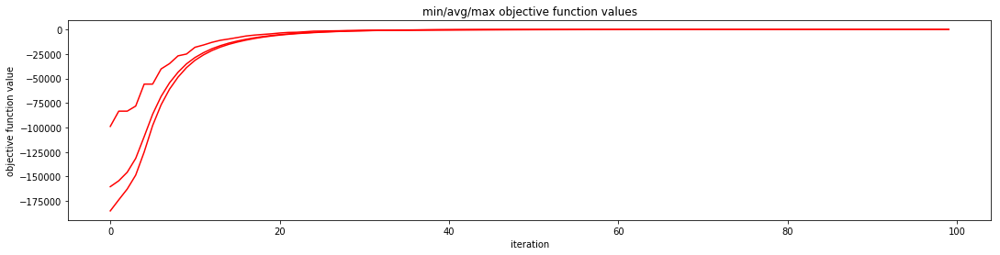

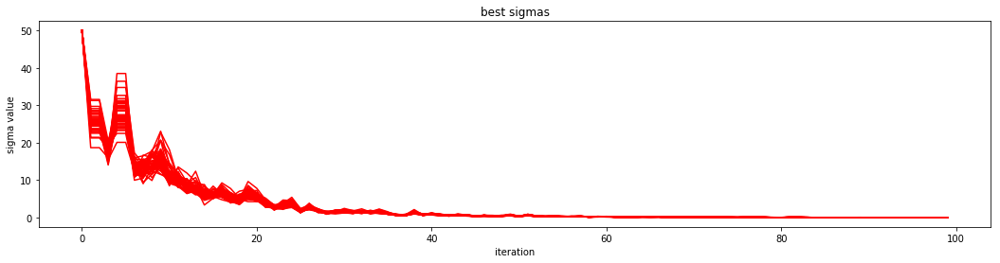



d = 100
Iteration 0000 : best score = -229501.38211660, mean score = -329730.84738527.
Iteration 0010 : best score = -98934.73800545, mean score = -123491.35249520.
Iteration 0020 : best score = -37130.89165604, mean score = -44371.43099134.
Iteration 0030 : best score = -16486.31667891, mean score = -19576.72115358.
Iteration 0040 : best score = -7921.01793364, mean score = -9272.34991289.
Iteration 0050 : best score = -3803.55787970, mean score = -4496.10002686.
Iteration 0060 : best score = -1743.14924001, mean score = -2167.93558532.
Iteration 0070 : best score = -872.70374940, mean score = -1061.55210366.
Iteration 0080 : best score = -436.42286389, mean score = -511.22893531.
Iteration 0090 : best score = -228.70028149, mean score = -258.74080190.


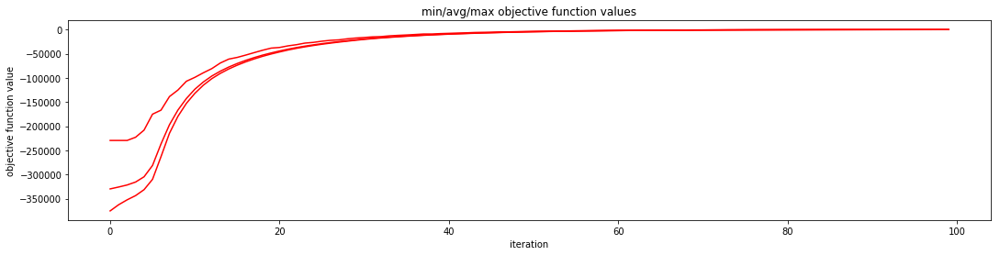

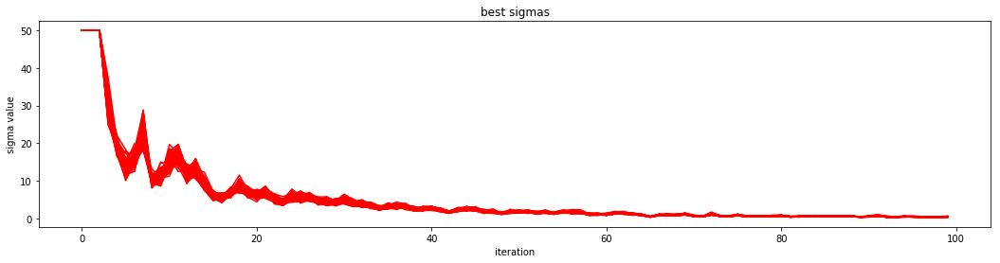

In [23]:
ds = [10, 20, 50, 100]
for d in ds:
    print(f'\n\nd = {d}')
    run_experiment(d, objective_function_F1)



d = 10
Iteration 0000 : best score = -3483.91255063, mean score = -25607.94156098.
Iteration 0010 : best score = -21.51430844, mean score = -147.43752082.
Iteration 0020 : best score = -0.06384405, mean score = -0.40574246.
Iteration 0030 : best score = -0.00015953, mean score = -0.00103717.
Iteration 0040 : best score = -0.00000031, mean score = -0.00000248.
Iteration 0050 : best score = -0.00000000, mean score = -0.00000001.
Iteration 0060 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0070 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0080 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0090 : best score = -0.00000000, mean score = -0.00000000.


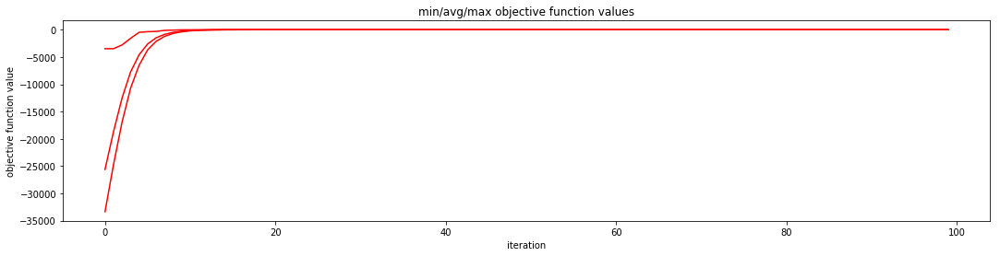

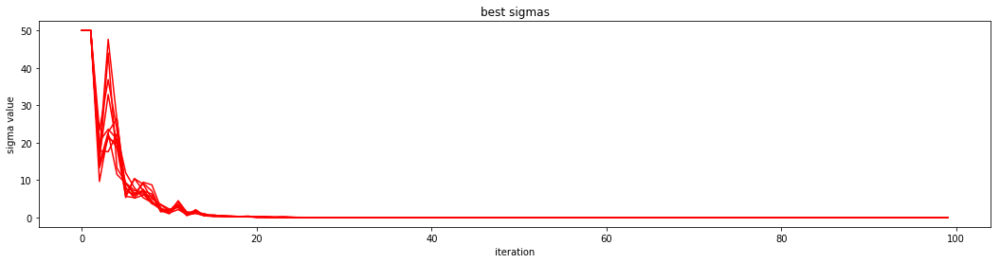



d = 20
Iteration 0000 : best score = -21810.69670990, mean score = -58638.28779116.
Iteration 0010 : best score = -787.15588313, mean score = -2051.32817046.
Iteration 0020 : best score = -23.03309213, mean score = -63.23855693.
Iteration 0030 : best score = -0.86797439, mean score = -1.93920529.
Iteration 0040 : best score = -0.03181288, mean score = -0.06780564.
Iteration 0050 : best score = -0.00111774, mean score = -0.00256644.
Iteration 0060 : best score = -0.00004189, mean score = -0.00009817.
Iteration 0070 : best score = -0.00000170, mean score = -0.00000394.
Iteration 0080 : best score = -0.00000006, mean score = -0.00000016.
Iteration 0090 : best score = -0.00000000, mean score = -0.00000001.


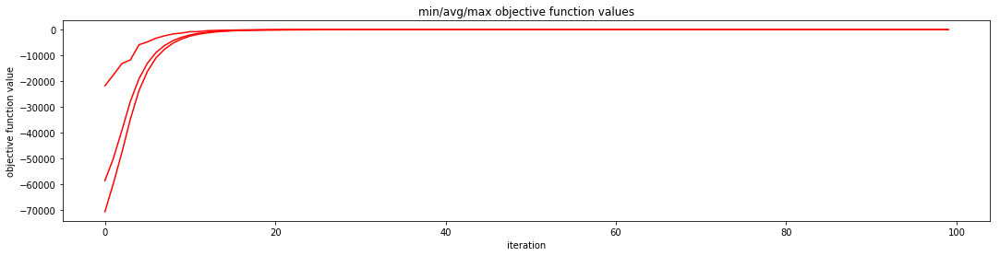

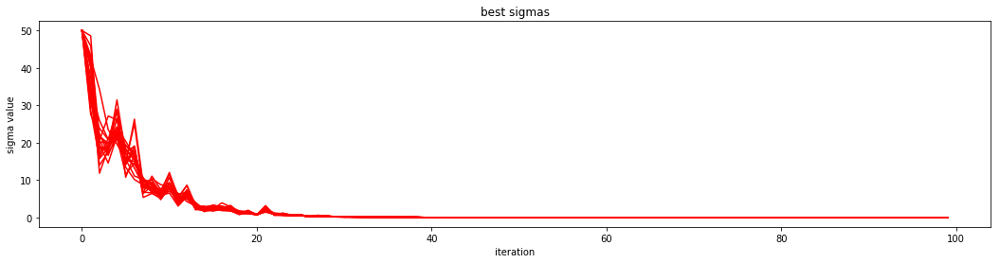



d = 50
Iteration 0000 : best score = -103247.87156292, mean score = -159477.05209771.
Iteration 0010 : best score = -19440.69776577, mean score = -27502.84950918.
Iteration 0020 : best score = -5102.39287631, mean score = -6612.26443278.
Iteration 0030 : best score = -1563.08112950, mean score = -1971.68053713.
Iteration 0040 : best score = -491.09248097, mean score = -606.95782002.
Iteration 0050 : best score = -140.18526636, mean score = -187.52925700.
Iteration 0060 : best score = -37.09781768, mean score = -58.00648935.
Iteration 0070 : best score = -12.42328732, mean score = -16.70696425.
Iteration 0080 : best score = -3.69070620, mean score = -4.96806541.
Iteration 0090 : best score = -1.10917479, mean score = -1.40822673.


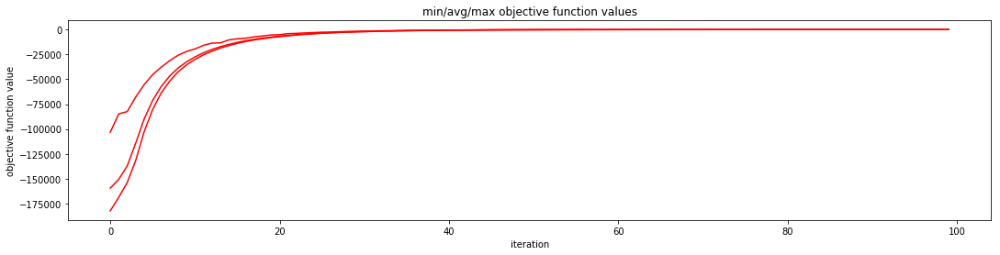

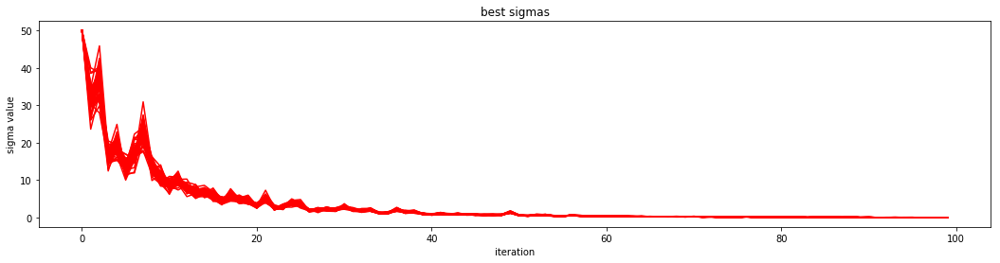



d = 100
Iteration 0000 : best score = -227967.81700197, mean score = -328634.28189872.
Iteration 0010 : best score = -86675.56395211, mean score = -112466.51020635.
Iteration 0020 : best score = -41486.27931412, mean score = -48626.90681743.
Iteration 0030 : best score = -21588.24231463, mean score = -25370.37058608.
Iteration 0040 : best score = -12334.23976891, mean score = -14081.19668480.
Iteration 0050 : best score = -6954.46530160, mean score = -7941.85130854.
Iteration 0060 : best score = -4045.94416132, mean score = -4527.04531449.
Iteration 0070 : best score = -2320.68290097, mean score = -2597.37788323.
Iteration 0080 : best score = -1294.57971807, mean score = -1473.86643931.
Iteration 0090 : best score = -733.50809696, mean score = -829.34950408.


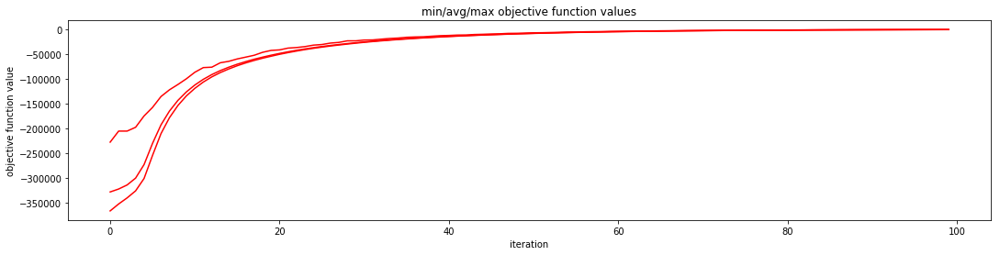

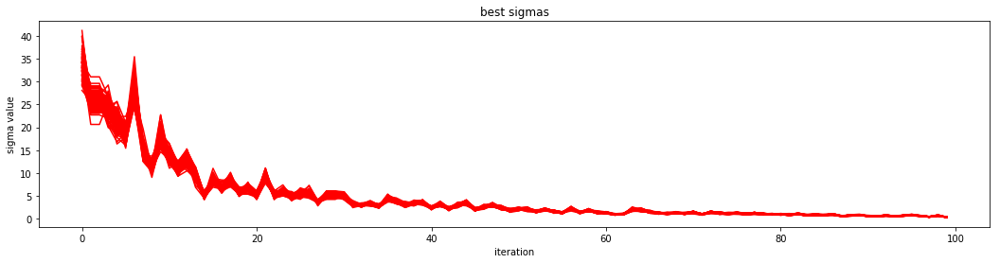

In [25]:
ds = [10, 20, 50, 100]
for d in ds:
    print(f'\n\nd = {d}')
    run_experiment(d, objective_function_F1, number_of_parents=5)

#### Rastrigin



d = 10
Iteration 0000 : best score = -4489.08773180, mean score = -26670.73718353.
Iteration 0010 : best score = -133.68627256, mean score = -314.29592759.
Iteration 0020 : best score = -27.54492428, mean score = -75.48329310.
Iteration 0030 : best score = -27.54492428, mean score = -61.77442971.
Iteration 0040 : best score = -24.53760839, mean score = -56.11263141.
Iteration 0050 : best score = -20.15295045, mean score = -52.24007051.
Iteration 0060 : best score = -20.15295045, mean score = -49.41772388.
Iteration 0070 : best score = -9.45520380, mean score = -45.40729413.
Iteration 0080 : best score = -1.23594235, mean score = -4.25106616.
Iteration 0090 : best score = -0.99628610, mean score = -1.00330342.


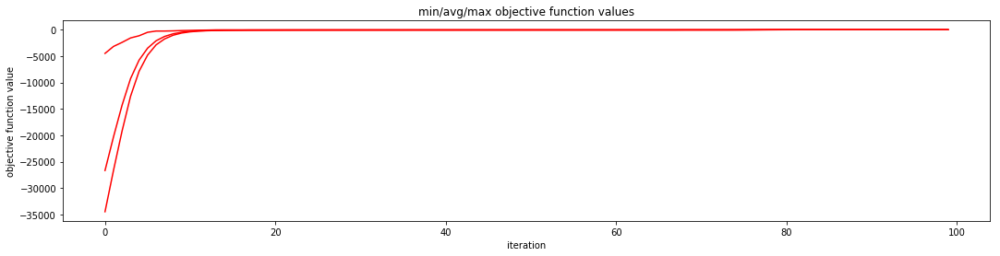

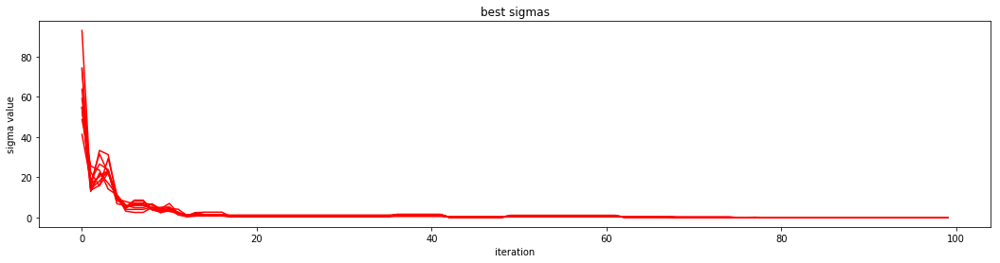



d = 20
Iteration 0000 : best score = -23648.94270446, mean score = -59838.56194825.
Iteration 0010 : best score = -999.63132922, mean score = -2653.27449676.
Iteration 0020 : best score = -170.41677572, mean score = -258.61597522.
Iteration 0030 : best score = -115.91590933, mean score = -174.88104686.
Iteration 0040 : best score = -102.32559524, mean score = -156.75314825.
Iteration 0050 : best score = -91.37644862, mean score = -147.41401272.
Iteration 0060 : best score = -79.32790923, mean score = -136.04836871.
Iteration 0070 : best score = -21.75166496, mean score = -26.10410581.
Iteration 0080 : best score = -18.96174735, mean score = -19.07291647.
Iteration 0090 : best score = -18.90547425, mean score = -18.90772468.


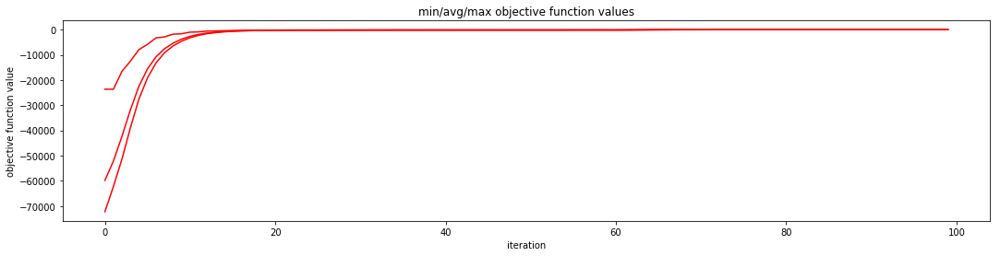

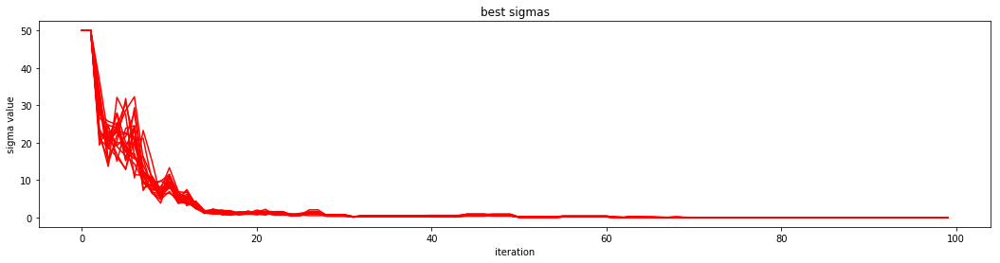



d = 50
Iteration 0000 : best score = -87762.48959849, mean score = -161681.37068680.
Iteration 0010 : best score = -18475.37327957, mean score = -28635.54966851.
Iteration 0020 : best score = -4509.82510988, mean score = -5976.80953898.
Iteration 0030 : best score = -1292.40152371, mean score = -1641.29677639.
Iteration 0040 : best score = -625.94453513, mean score = -791.78897185.
Iteration 0050 : best score = -476.51747654, mean score = -597.73565708.
Iteration 0060 : best score = -437.71283934, mean score = -533.54865959.
Iteration 0070 : best score = -407.24617646, mean score = -502.17043534.
Iteration 0080 : best score = -384.16618449, mean score = -483.27020862.
Iteration 0090 : best score = -367.36148415, mean score = -469.37444725.


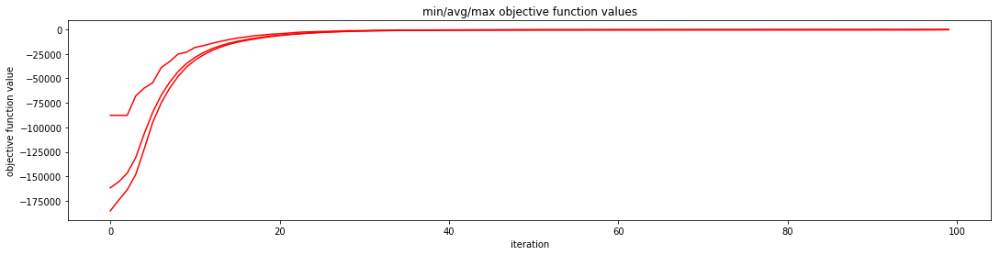

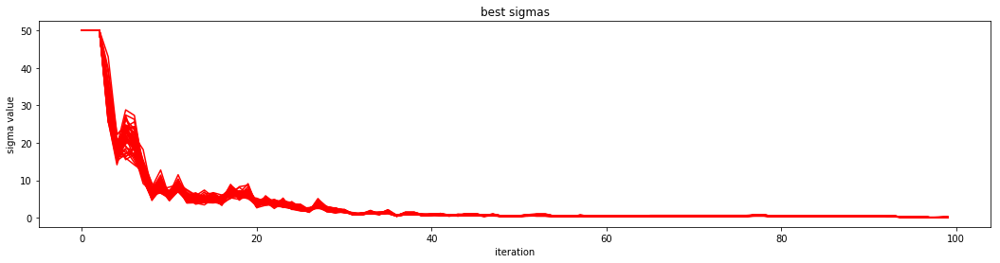



d = 100
Iteration 0000 : best score = -237493.56521679, mean score = -329139.43356292.
Iteration 0010 : best score = -98090.31908156, mean score = -126083.55572417.
Iteration 0020 : best score = -40746.16325171, mean score = -47178.57928568.
Iteration 0030 : best score = -19046.78088813, mean score = -21961.77272262.
Iteration 0040 : best score = -9919.70138709, mean score = -11402.47712514.
Iteration 0050 : best score = -5217.20490925, mean score = -6114.22241486.
Iteration 0060 : best score = -3135.30701594, mean score = -3543.42999860.
Iteration 0070 : best score = -2108.24827568, mean score = -2380.17748526.
Iteration 0080 : best score = -1539.52230134, mean score = -1809.01582482.
Iteration 0090 : best score = -1348.63113491, mean score = -1531.07100627.


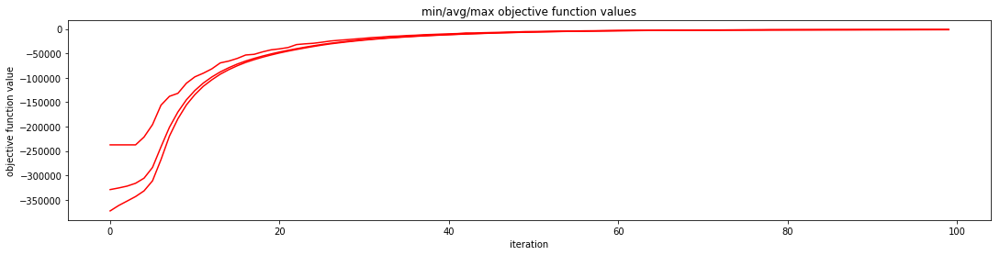

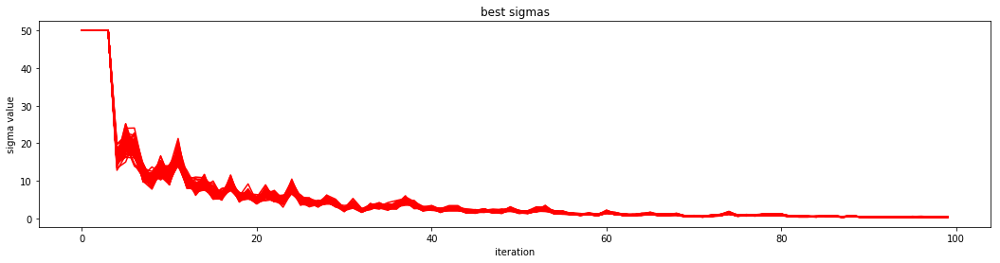

In [29]:
for d in ds:
    print(f'\n\nd = {d}')
    run_experiment(d, objective_function_F6, T=100)



d = 10
Iteration 0000 : best score = -4586.04358530, mean score = -25820.81855316.
Iteration 0010 : best score = -84.80113863, mean score = -267.81913406.
Iteration 0020 : best score = -28.66108545, mean score = -74.56211285.
Iteration 0030 : best score = -25.93332576, mean score = -61.77140112.
Iteration 0040 : best score = -15.95970757, mean score = -56.68915835.
Iteration 0050 : best score = -15.95970757, mean score = -53.37931983.
Iteration 0060 : best score = -14.89392676, mean score = -51.09911671.
Iteration 0070 : best score = -14.89392676, mean score = -49.43519145.
Iteration 0080 : best score = -14.89392676, mean score = -48.09084880.
Iteration 0090 : best score = -14.89392676, mean score = -46.81689900.


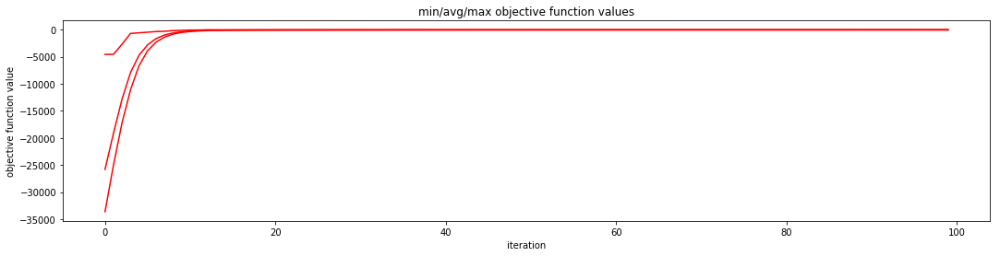

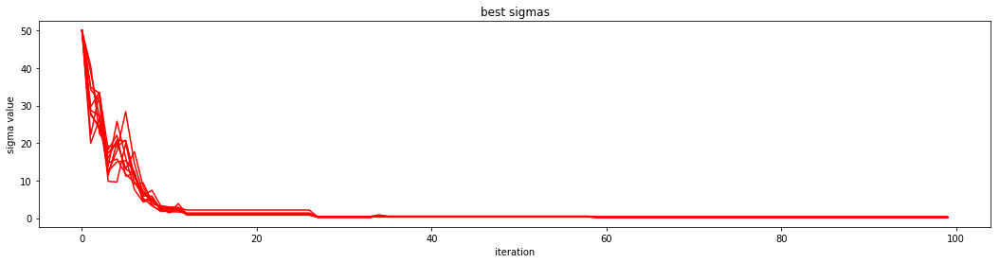



d = 20
Iteration 0000 : best score = -22770.09062775, mean score = -58882.79190022.
Iteration 0010 : best score = -1245.93870668, mean score = -2393.77161912.
Iteration 0020 : best score = -154.08550785, mean score = -275.22502390.
Iteration 0030 : best score = -111.15929468, mean score = -185.25394421.
Iteration 0040 : best score = -111.15929468, mean score = -164.91779492.
Iteration 0050 : best score = -101.23052091, mean score = -153.93918170.
Iteration 0060 : best score = -86.15394127, mean score = -146.09822819.
Iteration 0070 : best score = -63.65849572, mean score = -136.21466801.
Iteration 0080 : best score = -20.85458264, mean score = -24.08806264.
Iteration 0090 : best score = -19.92713716, mean score = -19.96165975.


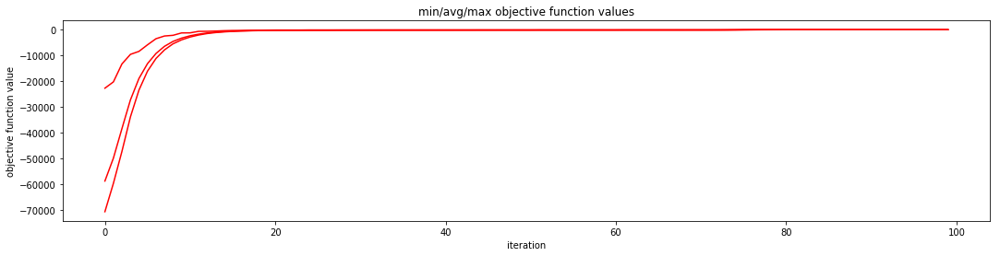

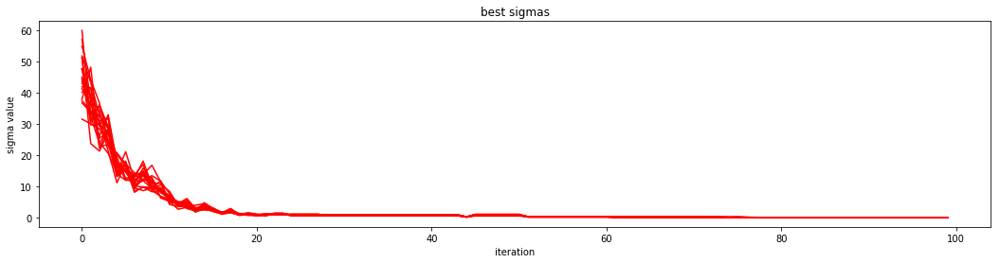



d = 50
Iteration 0000 : best score = -100191.85685313, mean score = -159512.89435039.
Iteration 0010 : best score = -19568.05746782, mean score = -28330.74993498.
Iteration 0020 : best score = -5723.07424692, mean score = -7432.78201916.
Iteration 0030 : best score = -2005.66030160, mean score = -2509.94299719.
Iteration 0040 : best score = -900.91454600, mean score = -1135.50598624.
Iteration 0050 : best score = -635.36227566, mean score = -768.20525321.
Iteration 0060 : best score = -533.93318837, mean score = -648.48996075.
Iteration 0070 : best score = -484.40203375, mean score = -599.99117775.
Iteration 0080 : best score = -481.60706390, mean score = -572.26617979.
Iteration 0090 : best score = -476.88110202, mean score = -554.51147313.


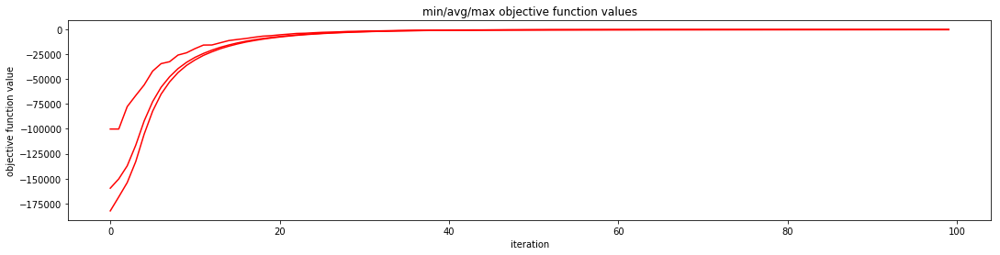

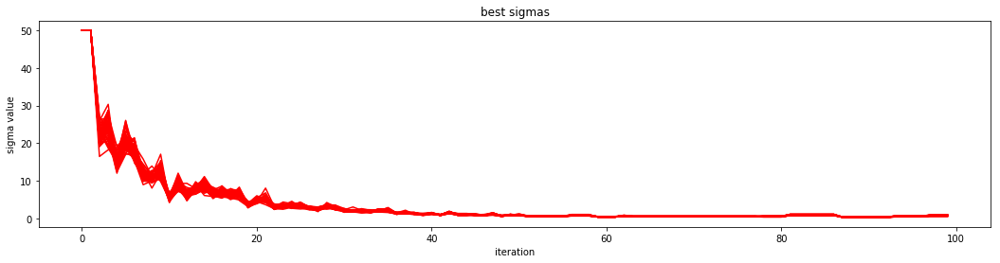



d = 100
Iteration 0000 : best score = -213328.68177595, mean score = -327094.78562390.
Iteration 0010 : best score = -93502.68999391, mean score = -112663.04211213.
Iteration 0020 : best score = -42123.12184091, mean score = -49617.40813273.
Iteration 0030 : best score = -22277.99719773, mean score = -25963.17202385.
Iteration 0040 : best score = -13121.63318036, mean score = -14472.64905714.
Iteration 0050 : best score = -7670.81919295, mean score = -8530.28287355.
Iteration 0060 : best score = -4811.07085003, mean score = -5293.91797605.
Iteration 0070 : best score = -3152.47125487, mean score = -3546.58333986.
Iteration 0080 : best score = -2332.20855682, mean score = -2593.56881615.
Iteration 0090 : best score = -1897.83027309, mean score = -2080.54887280.


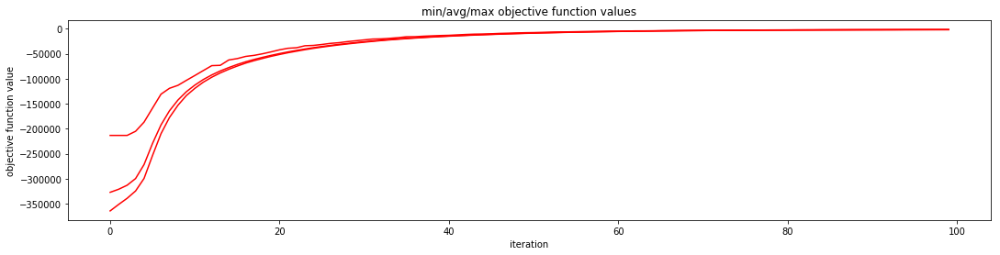

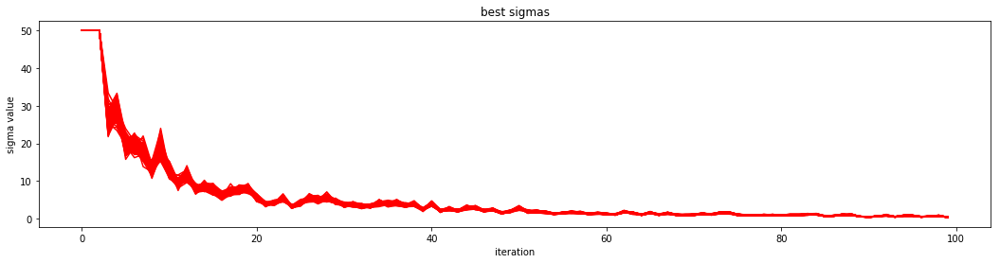

In [27]:
for d in ds:
    print(f'\n\nd = {d}')
    run_experiment(d, objective_function_F6, T=100, number_of_parents=5)

#### Schwefel



d = 10
Iteration 0000 : best score = -3191.38161278, mean score = -3965.86958099.
Iteration 0010 : best score = -2139.39328064, mean score = -3180.50623242.
Iteration 0020 : best score = -1755.65754026, mean score = -2346.42534559.
Iteration 0030 : best score = -1755.65754026, mean score = -2255.08824209.
Iteration 0040 : best score = -1755.65754026, mean score = -2219.40079260.
Iteration 0050 : best score = -1755.65754026, mean score = -2196.72942590.
Iteration 0060 : best score = -1755.65754026, mean score = -2175.76752693.
Iteration 0070 : best score = -1755.65754026, mean score = -2159.86182802.
Iteration 0080 : best score = -1755.65754026, mean score = -2148.87096076.
Iteration 0090 : best score = -1755.65754026, mean score = -2139.96064723.


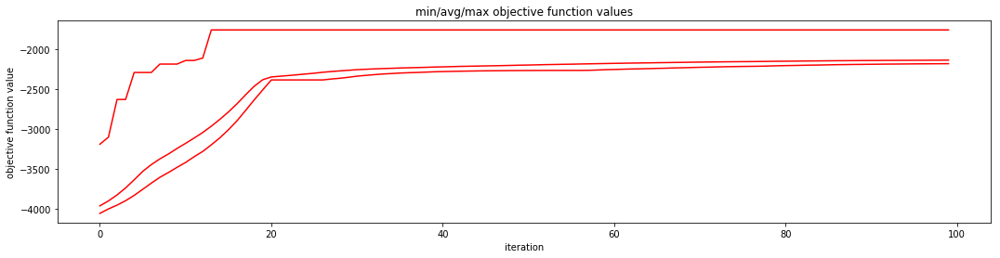

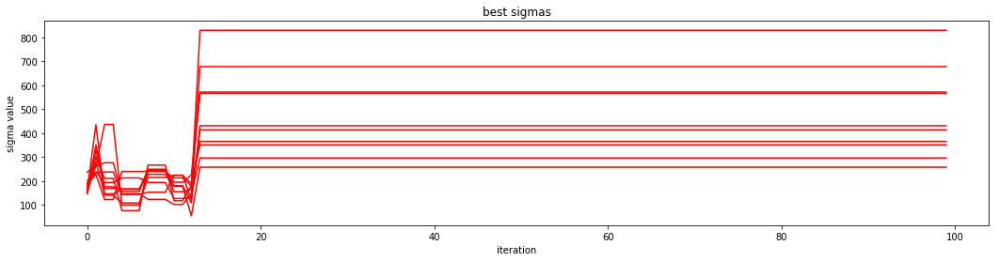



d = 20
Iteration 0000 : best score = -6976.87357877, mean score = -8037.59027927.
Iteration 0010 : best score = -5436.75511035, mean score = -7171.46629973.
Iteration 0020 : best score = -5322.18934605, mean score = -6682.74125220.
Iteration 0030 : best score = -4373.24254653, mean score = -5235.97080889.
Iteration 0040 : best score = -4127.72801556, mean score = -4695.81766557.
Iteration 0050 : best score = -4127.72801556, mean score = -4639.05890089.
Iteration 0060 : best score = -4127.72801556, mean score = -4617.89951329.
Iteration 0070 : best score = -4127.72801556, mean score = -4602.51348663.
Iteration 0080 : best score = -4127.72801556, mean score = -4588.65571140.
Iteration 0090 : best score = -4127.72801556, mean score = -4573.69371587.


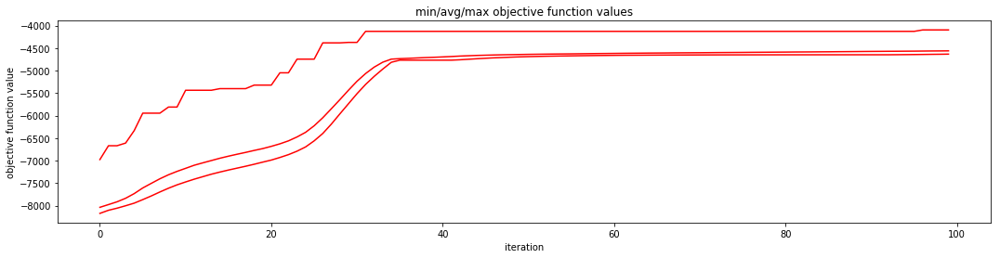

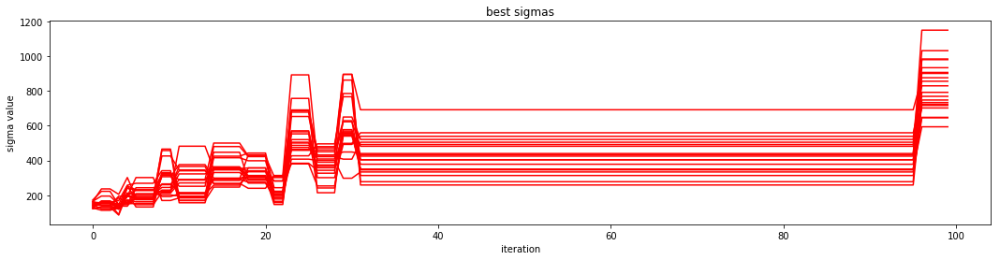



d = 50
Iteration 0000 : best score = -18720.08221907, mean score = -20248.77672231.
Iteration 0010 : best score = -16831.35728819, mean score = -19459.45888103.
Iteration 0020 : best score = -16512.88164125, mean score = -18661.93049206.
Iteration 0030 : best score = -16172.49378030, mean score = -18345.18169245.
Iteration 0040 : best score = -16172.49378030, mean score = -18158.52673022.
Iteration 0050 : best score = -16022.19315170, mean score = -18007.49123109.
Iteration 0060 : best score = -16022.19315170, mean score = -17893.44254343.
Iteration 0070 : best score = -16022.19315170, mean score = -17769.71930942.
Iteration 0080 : best score = -16022.19315170, mean score = -17646.61332997.
Iteration 0090 : best score = -15221.87019853, mean score = -17353.40392837.


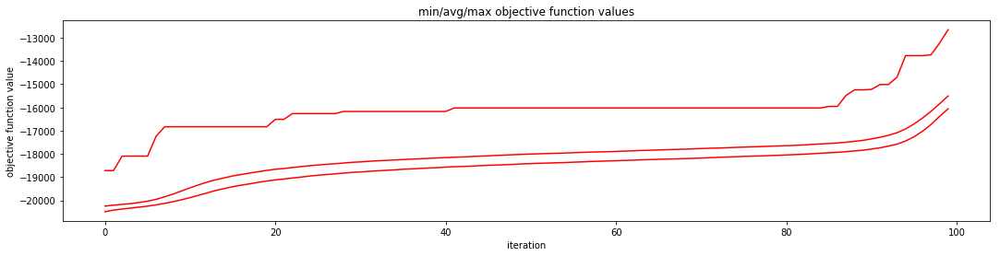

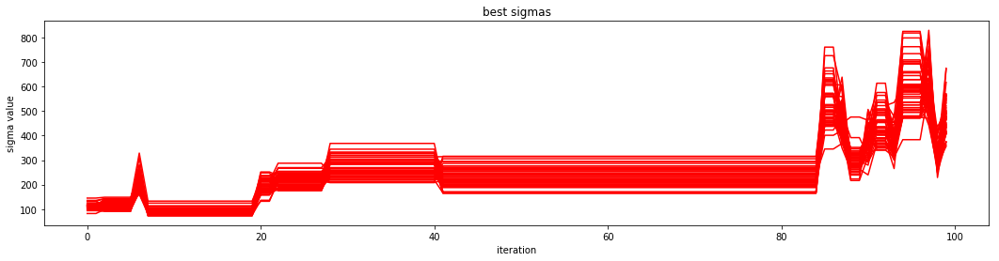



d = 100
Iteration 0000 : best score = -39252.17242659, mean score = -40606.94072840.
Iteration 0010 : best score = -38427.27320691, mean score = -40253.13717713.
Iteration 0020 : best score = -36666.61304502, mean score = -36937.51084191.
Iteration 0030 : best score = -35991.26586760, mean score = -36073.98398817.
Iteration 0040 : best score = -35747.84345773, mean score = -35786.03953630.
Iteration 0050 : best score = -35637.65259174, mean score = -35653.87987487.
Iteration 0060 : best score = -35582.08897427, mean score = -35591.67223247.
Iteration 0070 : best score = -35559.19403363, mean score = -35562.51319441.
Iteration 0080 : best score = -35546.29404018, mean score = -35548.20916422.
Iteration 0090 : best score = -35540.47044323, mean score = -35541.46719998.


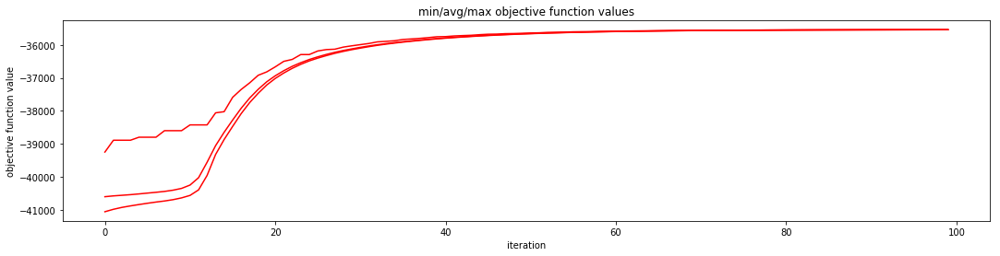

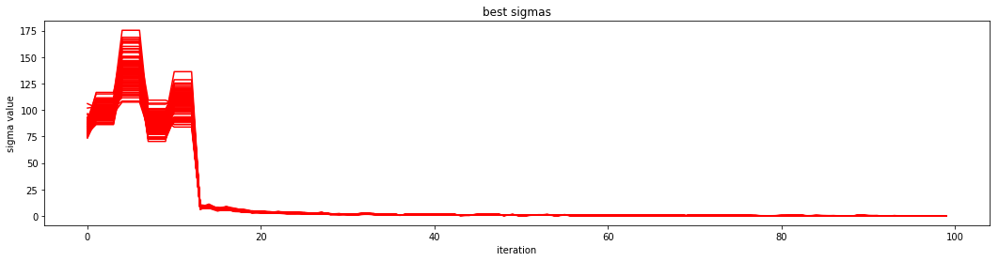

In [33]:
for d in ds:
    print(f'\n\nd = {d}')
    run_experiment(d, objective_function_F7)



d = 10
Iteration 0000 : best score = -3326.15124067, mean score = -3964.98381746.
Iteration 0010 : best score = -1475.53001115, mean score = -3281.68579906.
Iteration 0020 : best score = -1475.53001115, mean score = -2967.21312563.
Iteration 0030 : best score = -1475.53001115, mean score = -2648.46321238.
Iteration 0040 : best score = -1475.53001115, mean score = -2315.32008103.
Iteration 0050 : best score = -1475.53001115, mean score = -2251.32250952.
Iteration 0060 : best score = -1475.53001115, mean score = -2224.36958969.
Iteration 0070 : best score = -1475.53001115, mean score = -2205.22419156.
Iteration 0080 : best score = -1475.53001115, mean score = -2187.89896097.
Iteration 0090 : best score = -1475.53001115, mean score = -2172.75805624.


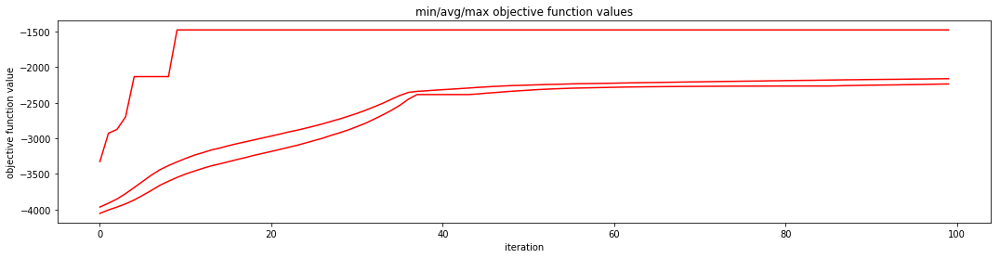

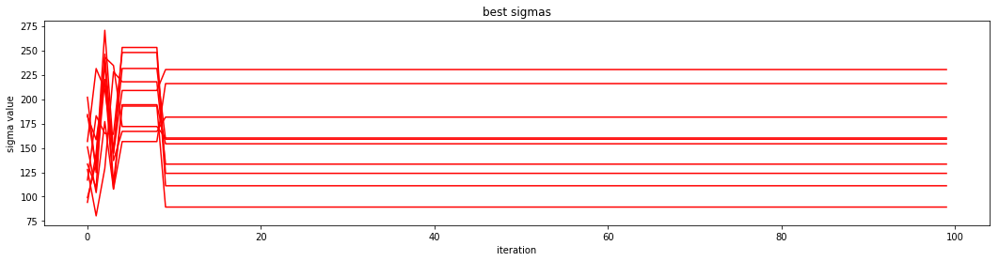



d = 20
Iteration 0000 : best score = -7198.30781988, mean score = -8021.36551878.
Iteration 0010 : best score = -5809.79347034, mean score = -7307.30861935.
Iteration 0020 : best score = -5214.41942654, mean score = -6843.44860886.
Iteration 0030 : best score = -5080.73895098, mean score = -6575.91990647.
Iteration 0040 : best score = -4722.60676090, mean score = -6207.08808237.
Iteration 0050 : best score = -4392.47261621, mean score = -5034.00102470.
Iteration 0060 : best score = -4286.87049919, mean score = -4687.92897082.
Iteration 0070 : best score = -4286.87049919, mean score = -4642.81605562.
Iteration 0080 : best score = -4286.87049919, mean score = -4624.08498424.
Iteration 0090 : best score = -4201.47012558, mean score = -4611.84089738.


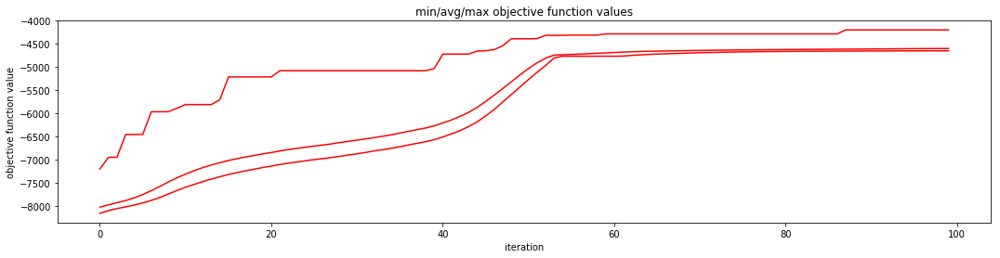

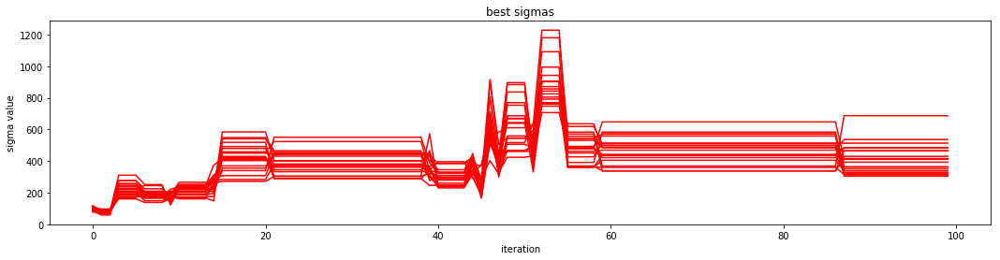



d = 50
Iteration 0000 : best score = -19500.02326851, mean score = -20238.41535847.
Iteration 0010 : best score = -18746.00491248, mean score = -19354.86447500.
Iteration 0020 : best score = -17888.93825612, mean score = -17938.86179843.
Iteration 0030 : best score = -17794.16519684, mean score = -17802.61398551.
Iteration 0040 : best score = -17773.95474789, mean score = -17776.47602165.
Iteration 0050 : best score = -17769.13808630, mean score = -17769.75418897.
Iteration 0060 : best score = -17767.81379500, mean score = -17768.00383857.
Iteration 0070 : best score = -17767.49956357, mean score = -17767.54692071.
Iteration 0080 : best score = -17767.42425407, mean score = -17767.43423225.
Iteration 0090 : best score = -17767.40321896, mean score = -17767.40572316.


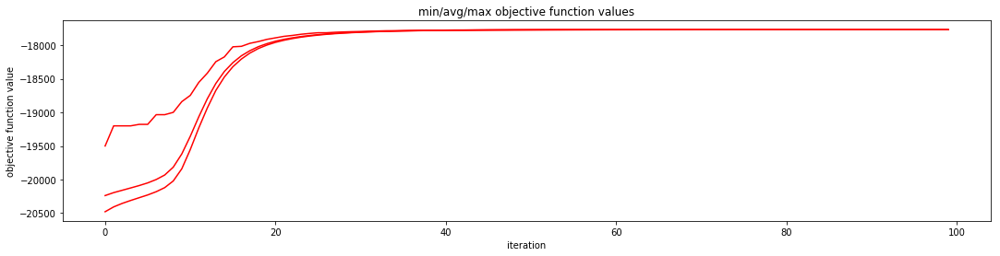

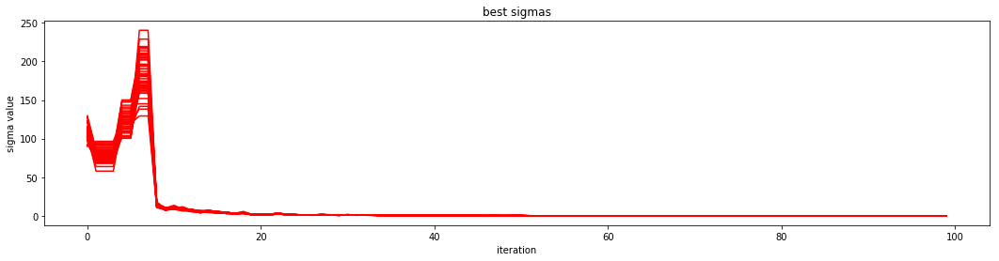



d = 100
Iteration 0000 : best score = -39573.14105547, mean score = -40601.83308721.
Iteration 0010 : best score = -38515.90739081, mean score = -39988.50236236.
Iteration 0020 : best score = -36339.09115751, mean score = -36555.11387590.
Iteration 0030 : best score = -35870.10258092, mean score = -35929.65076849.
Iteration 0040 : best score = -35699.65368834, mean score = -35727.15333528.
Iteration 0050 : best score = -35621.03111155, mean score = -35633.26536638.
Iteration 0060 : best score = -35578.71388789, mean score = -35586.32016034.
Iteration 0070 : best score = -35558.26303224, mean score = -35561.75928640.
Iteration 0080 : best score = -35547.59436888, mean score = -35549.12879373.
Iteration 0090 : best score = -35541.41996058, mean score = -35542.47858244.


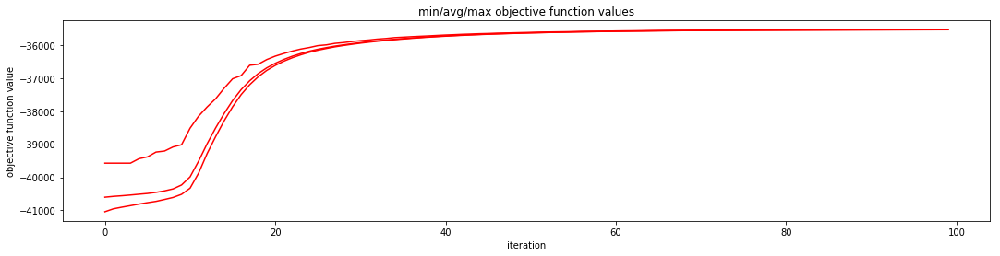

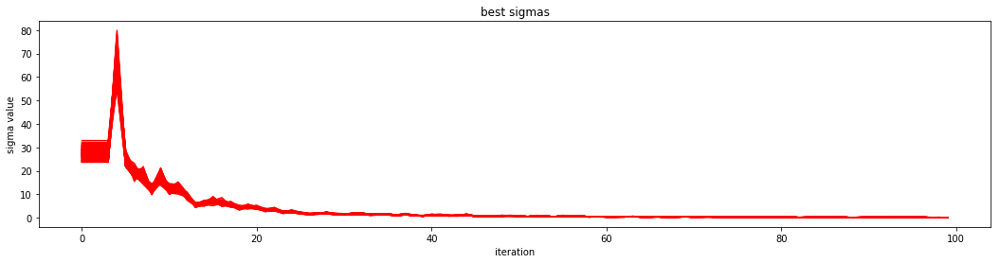

In [34]:
for d in ds:
    print(f'\n\nd = {d}')
    run_experiment(d, objective_function_F7, number_of_parents=3)

#### Griewank



d = 10
Iteration 0000 : best score = -2.13757051, mean score = -7.55306221.
Iteration 0010 : best score = -0.64739316, mean score = -1.04708289.
Iteration 0020 : best score = -0.07839082, mean score = -0.39813086.
Iteration 0030 : best score = -0.00028997, mean score = -0.00174224.
Iteration 0040 : best score = -0.00000153, mean score = -0.00000868.
Iteration 0050 : best score = -0.00000001, mean score = -0.00000004.
Iteration 0060 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0070 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0080 : best score = 0.00000000, mean score = -0.00000000.
Iteration 0090 : best score = 0.00000000, mean score = 0.00000000.


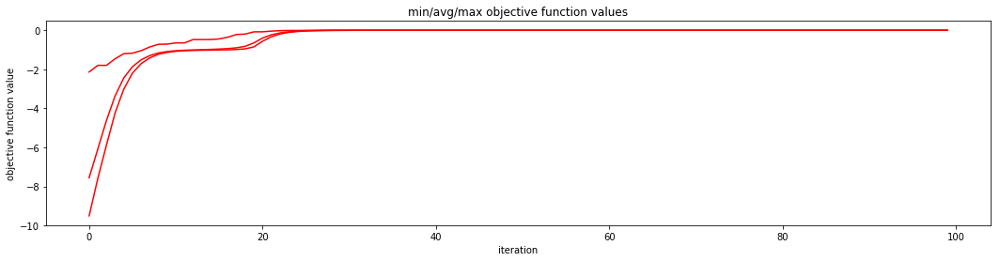

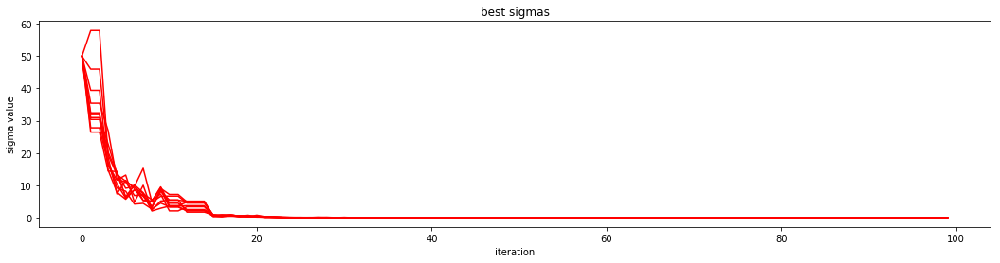



d = 20
Iteration 0000 : best score = -6.03146434, mean score = -15.91828278.
Iteration 0010 : best score = -1.21680585, mean score = -1.61230277.
Iteration 0020 : best score = -0.64253673, mean score = -0.99925657.
Iteration 0030 : best score = -0.07178300, mean score = -0.15211607.
Iteration 0040 : best score = -0.00843640, mean score = -0.01400059.
Iteration 0050 : best score = -0.00083037, mean score = -0.00168859.
Iteration 0060 : best score = -0.00005740, mean score = -0.00014756.
Iteration 0070 : best score = -0.00000327, mean score = -0.00000829.
Iteration 0080 : best score = -0.00000017, mean score = -0.00000042.
Iteration 0090 : best score = -0.00000001, mean score = -0.00000002.


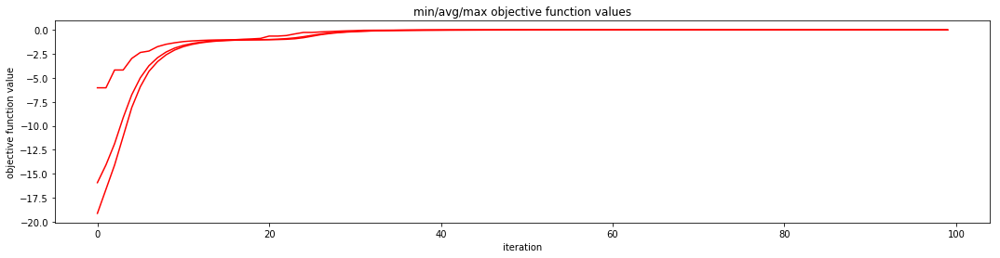

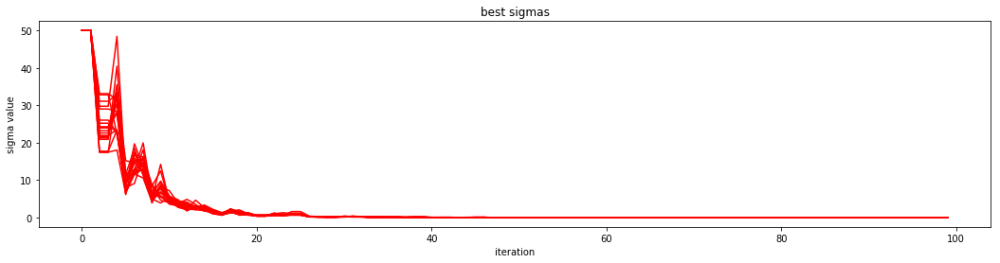



d = 50
Iteration 0000 : best score = -27.81699438, mean score = -41.32912462.
Iteration 0010 : best score = -5.62744472, mean score = -8.01671232.
Iteration 0020 : best score = -2.01311364, mean score = -2.36372698.
Iteration 0030 : best score = -1.23656903, mean score = -1.31799927.
Iteration 0040 : best score = -1.04870950, mean score = -1.07161008.
Iteration 0050 : best score = -0.77454527, mean score = -0.88020736.
Iteration 0060 : best score = -0.40621381, mean score = -0.48780577.
Iteration 0070 : best score = -0.25684670, mean score = -0.28418837.
Iteration 0080 : best score = -0.14895617, mean score = -0.17357914.
Iteration 0090 : best score = -0.09074564, mean score = -0.10445976.


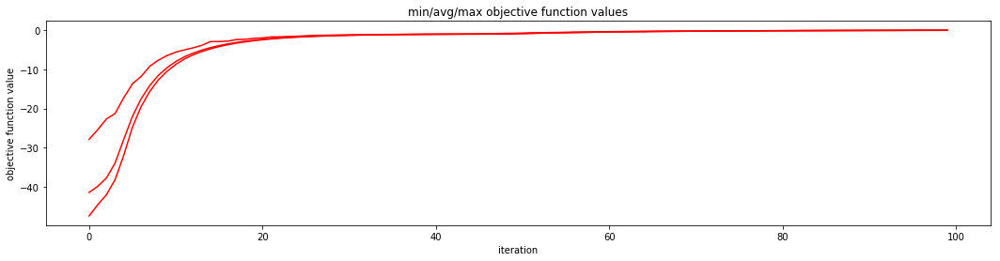

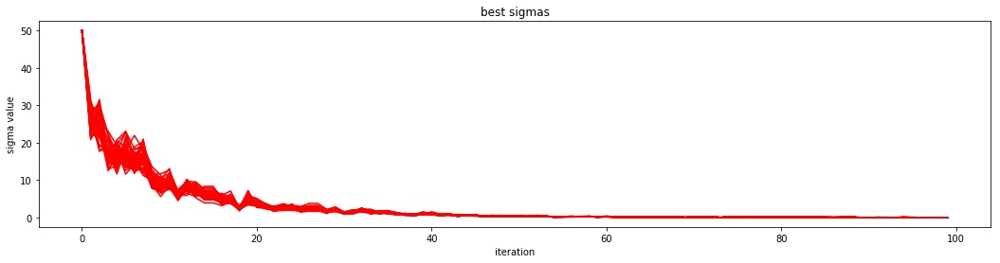



d = 100
Iteration 0000 : best score = -58.24886403, mean score = -83.52112842.
Iteration 0010 : best score = -23.15507943, mean score = -32.05180752.
Iteration 0020 : best score = -10.79373549, mean score = -12.51695773.
Iteration 0030 : best score = -5.23796816, mean score = -6.25109798.
Iteration 0040 : best score = -3.13978168, mean score = -3.47773357.
Iteration 0050 : best score = -2.00801305, mean score = -2.17666167.
Iteration 0060 : best score = -1.45718071, mean score = -1.57029873.
Iteration 0070 : best score = -1.21357467, mean score = -1.27159910.
Iteration 0080 : best score = -1.10857555, mean score = -1.12768020.
Iteration 0090 : best score = -1.04687021, mean score = -1.06202759.


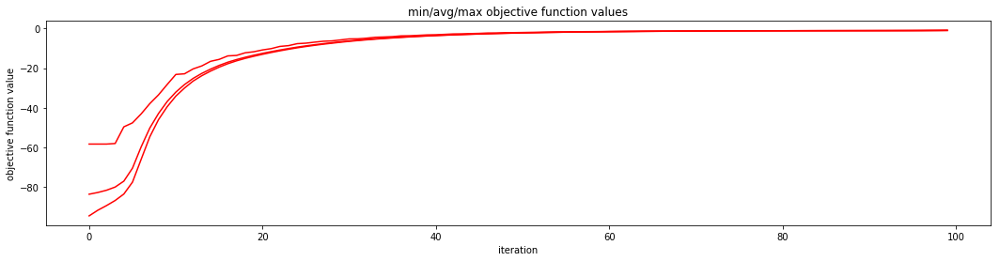

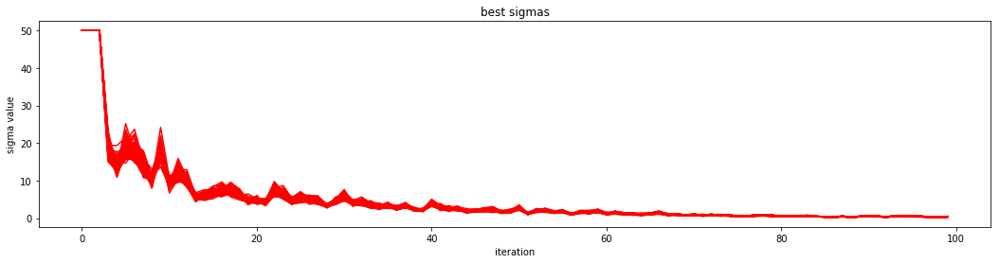

In [35]:
for d in ds:
    print(f'\n\nd = {d}')
    run_experiment(d, objective_function_F8)



d = 10
Iteration 0000 : best score = -2.50937435, mean score = -7.48003477.
Iteration 0010 : best score = -0.64649657, mean score = -1.04228150.
Iteration 0020 : best score = -0.27961897, mean score = -0.87125388.
Iteration 0030 : best score = -0.00387335, mean score = -0.02332580.
Iteration 0040 : best score = -0.00001679, mean score = -0.00007983.
Iteration 0050 : best score = -0.00000016, mean score = -0.00000066.
Iteration 0060 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0070 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0080 : best score = -0.00000000, mean score = -0.00000000.
Iteration 0090 : best score = 0.00000000, mean score = 0.00000000.


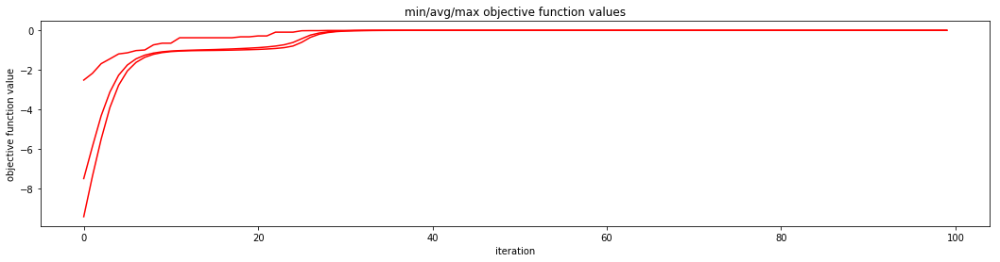

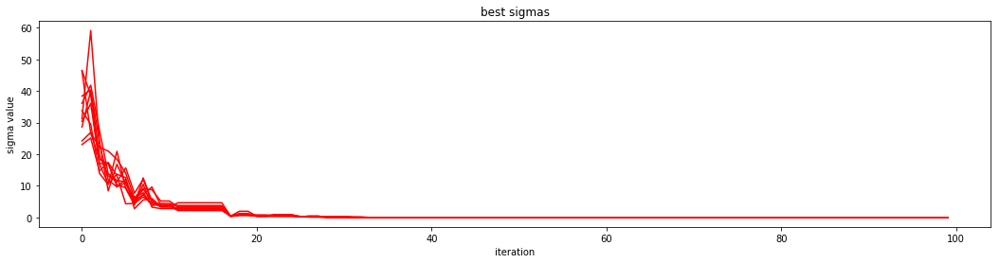



d = 20
Iteration 0000 : best score = -6.47748294, mean score = -15.90132706.
Iteration 0010 : best score = -1.24606403, mean score = -1.53587175.
Iteration 0020 : best score = -0.71136379, mean score = -1.00585777.
Iteration 0030 : best score = -0.09196990, mean score = -0.15956641.
Iteration 0040 : best score = -0.01448342, mean score = -0.02489857.
Iteration 0050 : best score = -0.00281121, mean score = -0.00483380.
Iteration 0060 : best score = -0.00031838, mean score = -0.00068630.
Iteration 0070 : best score = -0.00003136, mean score = -0.00006464.
Iteration 0080 : best score = -0.00000182, mean score = -0.00000410.
Iteration 0090 : best score = -0.00000007, mean score = -0.00000021.


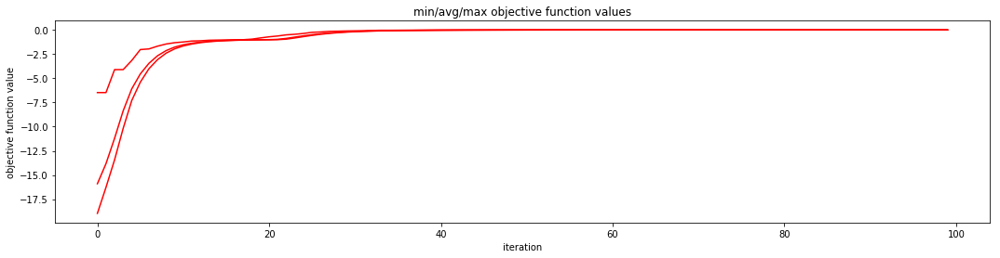

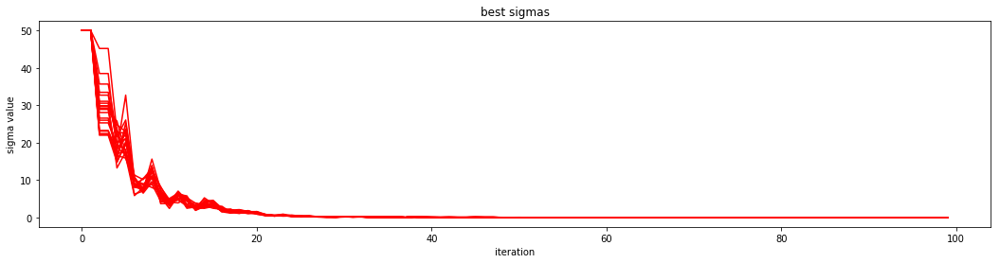



d = 50
Iteration 0000 : best score = -26.30503505, mean score = -40.43571787.
Iteration 0010 : best score = -5.76816190, mean score = -7.38602044.
Iteration 0020 : best score = -1.99385219, mean score = -2.37983610.
Iteration 0030 : best score = -1.24436886, mean score = -1.33968359.
Iteration 0040 : best score = -1.06629003, mean score = -1.08917217.
Iteration 0050 : best score = -0.88036754, mean score = -0.98004719.
Iteration 0060 : best score = -0.49451741, mean score = -0.57937132.
Iteration 0070 : best score = -0.29427805, mean score = -0.33323326.
Iteration 0080 : best score = -0.17496397, mean score = -0.20387676.
Iteration 0090 : best score = -0.11116790, mean score = -0.12518650.


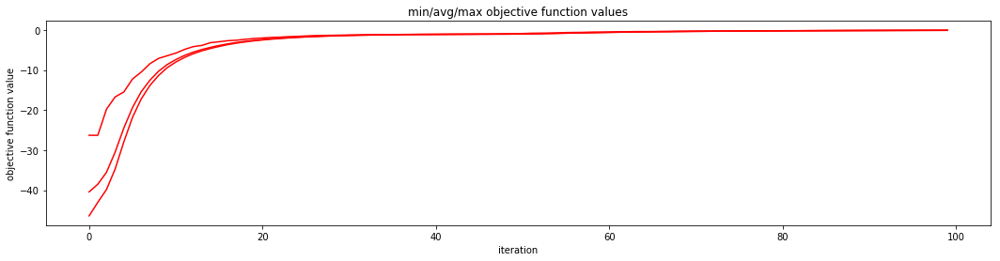

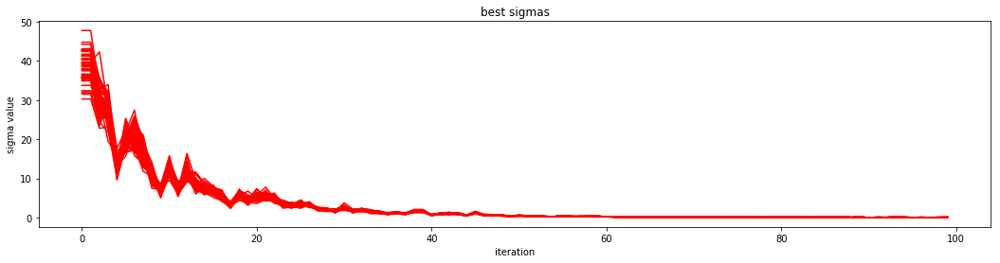



d = 100
Iteration 0000 : best score = -60.98495431, mean score = -83.08632728.
Iteration 0010 : best score = -24.26522590, mean score = -30.00889086.
Iteration 0020 : best score = -10.80508914, mean score = -12.53858059.
Iteration 0030 : best score = -5.91638514, mean score = -6.55798799.
Iteration 0040 : best score = -3.47681281, mean score = -3.84474840.
Iteration 0050 : best score = -2.28162210, mean score = -2.46686703.
Iteration 0060 : best score = -1.62555948, mean score = -1.75301990.
Iteration 0070 : best score = -1.34443789, mean score = -1.38920409.
Iteration 0080 : best score = -1.17730839, mean score = -1.20493476.
Iteration 0090 : best score = -1.09369493, mean score = -1.10799324.


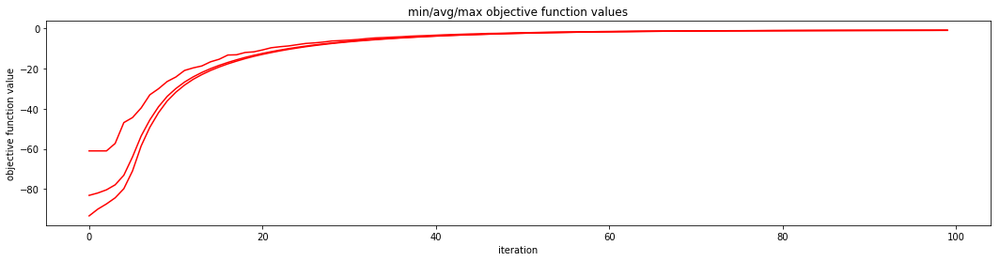

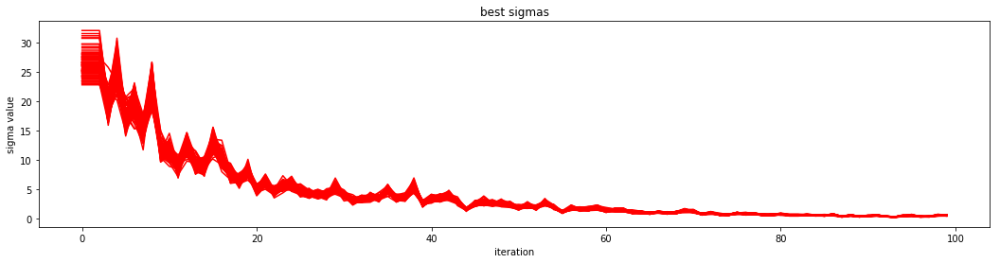

In [36]:
for d in ds:
    print(f'\n\nd = {d}')
    run_experiment(d, objective_function_F8, number_of_parents=3)

### Problem 2

In [20]:
from matplotlib.patches import Ellipse
from scipy.stats import norm, chi2


def plot_point_cov(points, q=0.95, ax=None, **kwargs):
    pos = points.mean(axis=0)
    cov = np.cov(points, rowvar=False)
    return plot_cov_ellipse(cov, pos, q, ax, **kwargs)

def plot_cov_ellipse(cov, pos, q=0.95, ax=None, **kwargs):
    def eigsorted(cov):
        vals, vecs = np.linalg.eigh(cov)
        order = vals.argsort()[::-1]
        return vals[order], vecs[:,order]

    if ax is None:
        ax = plt.gca()

    q = np.asarray(q)
    r2 = chi2.ppf(q, 2)
    val, vec = np.linalg.eigh(cov)
    width, height = 2 * np.sqrt(val[:, None] * r2)
    rotation = np.degrees(np.arctan2(*vec[::-1, 0]))
    
    ellip = Ellipse(xy=pos, width=width, height=height, angle=rotation, **kwargs)

    ax.add_artist(ellip)
    return width, height

def mutation_benchmark(objective_function, mutation_function, original_individual=np.array([[1, 1]]), N=250, d=2, T=20):
    results = np.empty(T, dtype=np.float64)
    best_values = np.empty(T, dtype=np.float64)
    for t in range(T):
        mutations = mutation_function(original_individual, N, d)
        results[t] = np.sum(objective_function(mutations) > objective_function(original_individual))
        best_values[t] = np.max(objective_function(mutations))
    
    domain_X = np.arange(-5, 5, 0.25)
    domain_Y = np.arange(-5, 5, 0.25)
    X, Y = np.meshgrid(domain_X, domain_Y)
    Z = - objective_function(np.vstack([X.ravel(), Y.ravel()]).T).reshape(X.shape[0], X.shape[1])

    plt.figure(figsize=(9, 9))
    plt.contour(X, Y, Z, 50)
    plt.plot(mutations[:, 0], mutations[:, 1], 'ro', markersize=2)
    plt.plot(original_individual[0, 0], original_individual[0, 1], 'k*', markersize=24)
    width, height = plot_point_cov(mutations, color='green', alpha=0.8)
    plt.title('Mutation')
    plt.show()
    
    print(f'Average fraction of better individuals after mutation: {results.mean() / N:.3f}')
    print(f'Objective function value for original individual: {objective_function(original_individual)[0]:.2f}')
    print(f'Average objective function value for best individual after mutation: {best_values.mean():.2f}')
    print(f'Width and height of ellipse: width = {width[0]:.2f}, height = {height[0]:.2f}')


#### Mutacja 1

In [21]:
def mutation1(original_individual, N, d, sigma=0.25):
    return original_individual + sigma * np.random.randn(N, d)

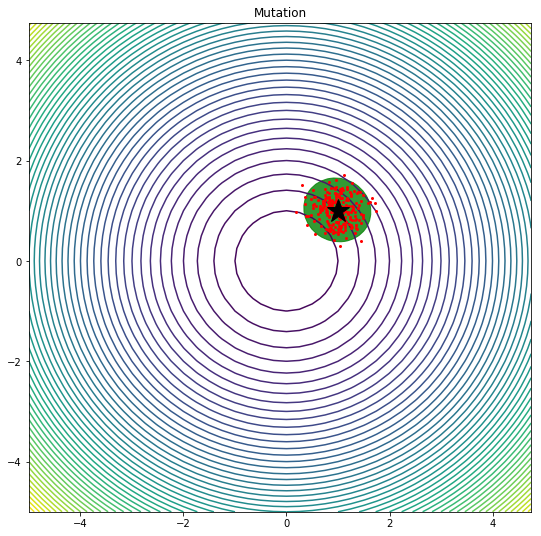

Average fraction of better individuals after mutation: 0.467
Objective function value for original individual: -2.00
Average objective function value for best individual after mutation: -0.61
Width and height of ellipse: width = 1.24, height = 1.33


In [22]:
mutation_benchmark(objective_function_F1, mutation1)

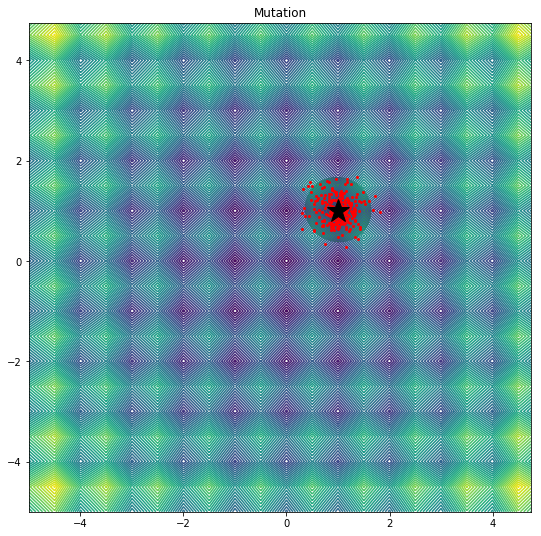

Average fraction of better individuals after mutation: 0.000
Objective function value for original individual: -2.00
Average objective function value for best individual after mutation: -2.08
Width and height of ellipse: width = 1.25, height = 1.30


In [23]:
mutation_benchmark(objective_function_F6, mutation1)

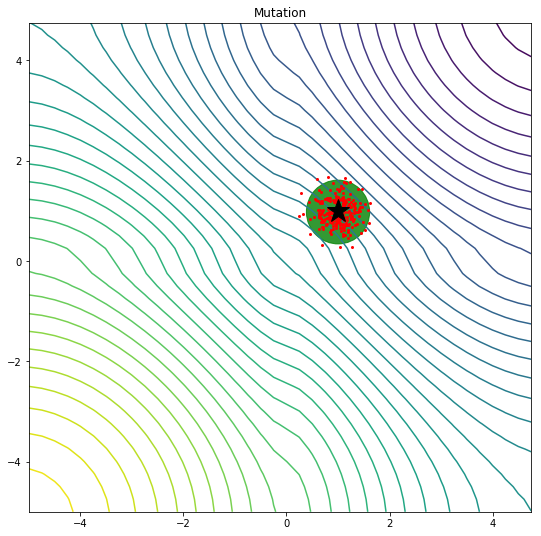

Average fraction of better individuals after mutation: 0.500
Objective function value for original individual: -836.28
Average objective function value for best individual after mutation: -835.11
Width and height of ellipse: width = 1.23, height = 1.27


In [24]:
mutation_benchmark(objective_function_F7, mutation1)

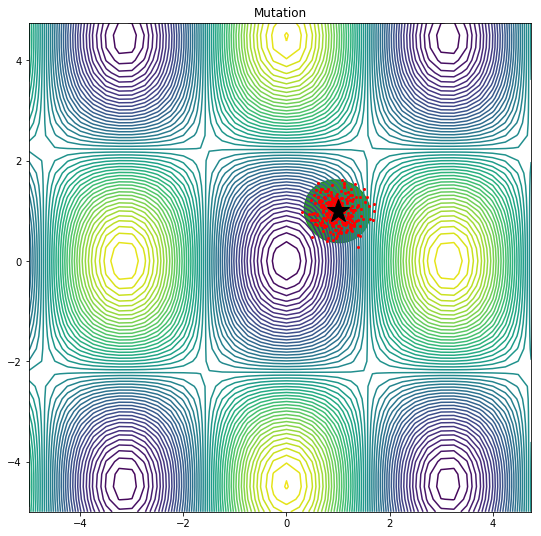

Average fraction of better individuals after mutation: 0.466
Objective function value for original individual: -0.59
Average objective function value for best individual after mutation: -0.20
Width and height of ellipse: width = 1.23, height = 1.31


In [25]:
mutation_benchmark(objective_function_F8, mutation1)

#### Mutacja 2

In [26]:
def mutation2(original_individual, N, d, sigma=np.array([0.25, 0.5])):
    return original_individual + sigma * np.random.randn(N, d)

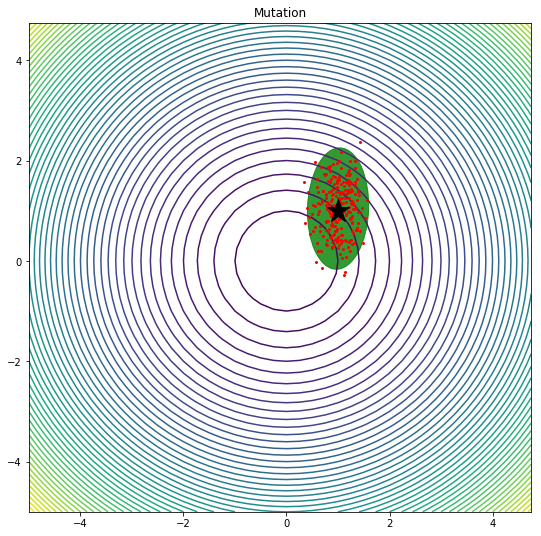

Average fraction of better individuals after mutation: 0.471
Objective function value for original individual: -2.00
Average objective function value for best individual after mutation: -0.35
Width and height of ellipse: width = 1.19, height = 2.42


In [27]:
mutation_benchmark(objective_function_F1, mutation2)

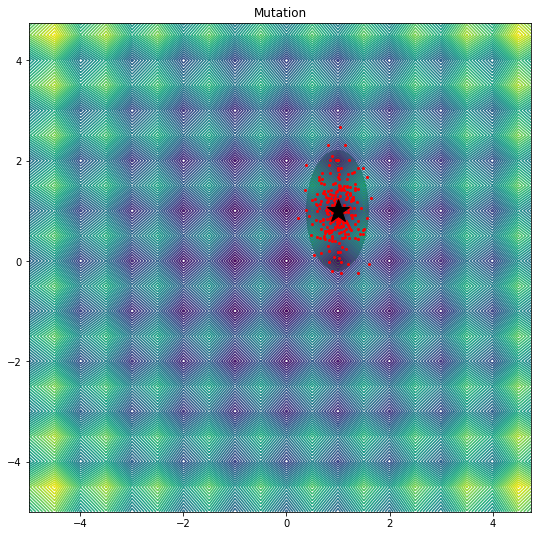

Average fraction of better individuals after mutation: 0.003
Objective function value for original individual: -2.00
Average objective function value for best individual after mutation: -1.84
Width and height of ellipse: width = 1.20, height = 2.39


In [28]:
mutation_benchmark(objective_function_F6, mutation2)

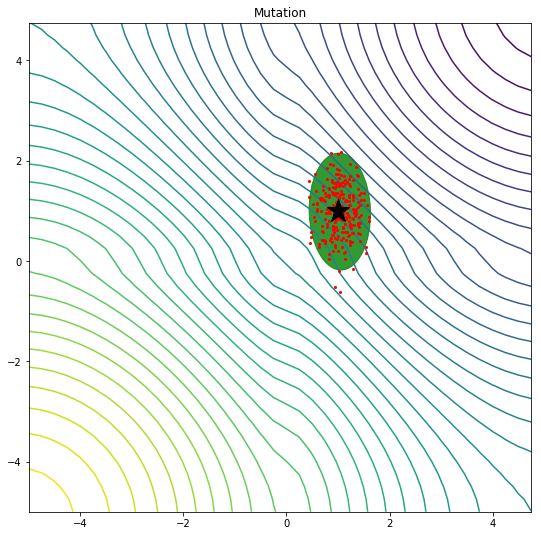

Average fraction of better individuals after mutation: 0.499
Objective function value for original individual: -836.28
Average objective function value for best individual after mutation: -834.50
Width and height of ellipse: width = 1.19, height = 2.33


In [29]:
mutation_benchmark(objective_function_F7, mutation2)

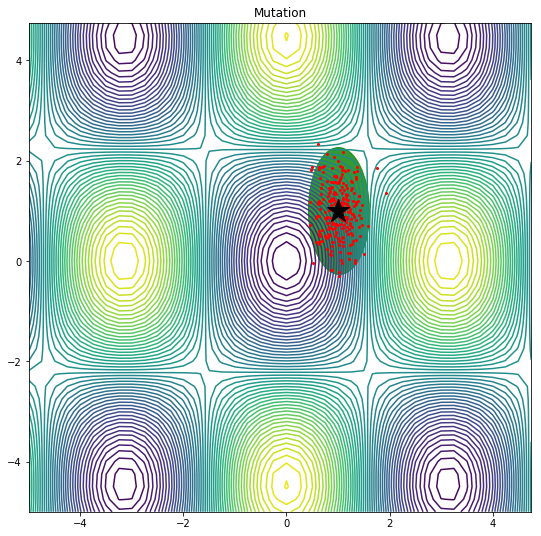

Average fraction of better individuals after mutation: 0.442
Objective function value for original individual: -0.59
Average objective function value for best individual after mutation: -0.14
Width and height of ellipse: width = 1.18, height = 2.53


In [30]:
mutation_benchmark(objective_function_F8, mutation2)

#### Mutacja 3

In [31]:
def mutation3(original_individual, N, d, S = np.array([[0.25, 0.25],[0.25, 0.5]])):
    return original_individual + np.dot(np.random.randn(N, d), np.linalg.cholesky(S).T)

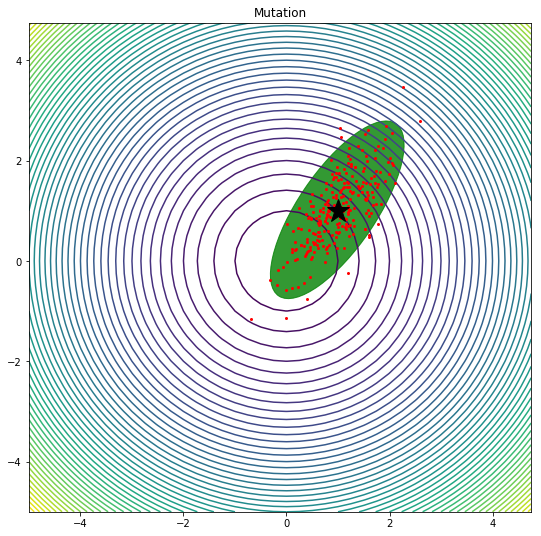

Average fraction of better individuals after mutation: 0.479
Objective function value for original individual: -2.00
Average objective function value for best individual after mutation: -0.02
Width and height of ellipse: width = 1.52, height = 4.12


In [32]:
mutation_benchmark(objective_function_F1, mutation3)

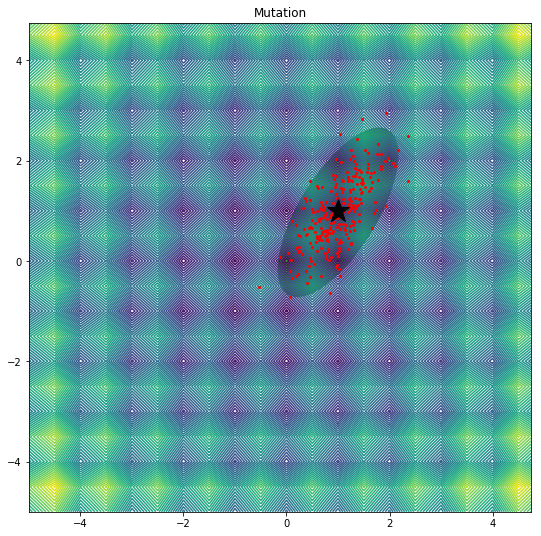

Average fraction of better individuals after mutation: 0.004
Objective function value for original individual: -2.00
Average objective function value for best individual after mutation: -1.53
Width and height of ellipse: width = 1.50, height = 3.80


In [33]:
mutation_benchmark(objective_function_F6, mutation3)

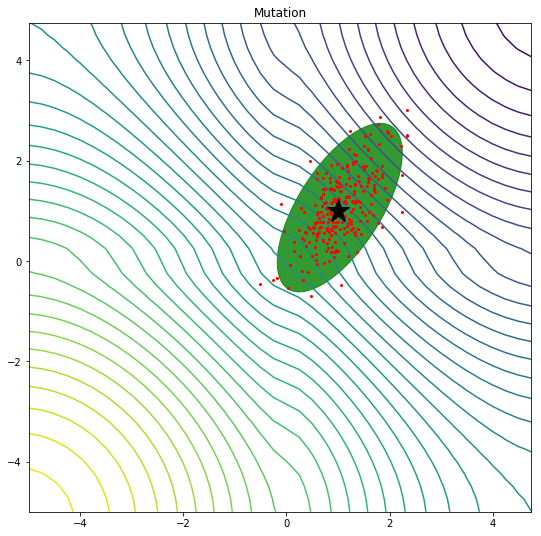

Average fraction of better individuals after mutation: 0.512
Objective function value for original individual: -836.28
Average objective function value for best individual after mutation: -832.86
Width and height of ellipse: width = 1.62, height = 3.81


In [34]:
mutation_benchmark(objective_function_F7, mutation3)

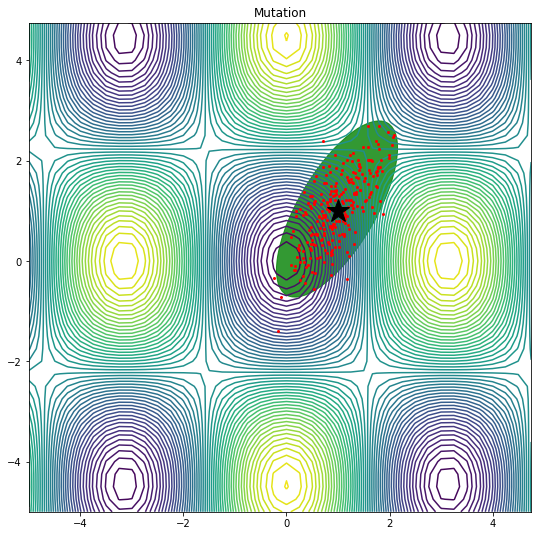

Average fraction of better individuals after mutation: 0.477
Objective function value for original individual: -0.59
Average objective function value for best individual after mutation: -0.01
Width and height of ellipse: width = 1.51, height = 3.95


In [35]:
mutation_benchmark(objective_function_F8, mutation3)